# Residual Plot Analysis — ExoALMA Data

This notebook analyzes residual plots from the ExoALMA program (Curone et al. 2025, Paper IV) to extract flux limits potentially associated with planet-forming signatures within the annuli of protoplanetary disks. The aim is not to spatially characterize these features — which are likely unresolved — but to constrain potential circumplanetary disk (CPD) properties using up-to-date CPD emission models, and to compare model performance in terms of predictive power.

**Reference**:  
Curone, P., Facchini, S., Andrews, S. M., et al. (2025). *exoALMA. IV. Substructures, Asymmetries, and the Faint Outer Disk in Continuum Emission*. *The Astrophysical Journal Letters*, **984**(1), L9. https://doi.org/10.3847/2041-8213/adc438


In [25]:
# Autoreload the imported modules
%load_ext autoreload
%autoreload 2


In [28]:
# import necessary libraries

import os  
import numpy as np  
import re  # Python’s regular expressions module to extract numbers from filenames
from astropy.io import fits
import pandas as pd
from gofish import imagecube
import matplotlib.pyplot as plt
import glob   # to find files matching a pattern
from reproject import reproject_interp
from IPython.display import display

# 
#from disk_residuals_median_SNR import DiskResiduals_Median_SNR as DiskResiduals

import disk_residuals_median_SNR
DiskResiduals = disk_residuals_median_SNR.DiskResiduals_Median_SNR


### Load all disks into a dictionary of DiskResiduals objects

In [2]:
# -----------------------------------------------------
# Load all disks into a dictionary of DiskResiduals objects
# -----------------------------------------------------
data_dir = "D:/exoALMA_disk_data"  # Use forward slashes for Windows or raw string
home_dir = "D:/CPD_MPIA/"  # Use forward slashes for Windows or raw string
# Load disk distances from file 
dist_df = pd.read_csv(home_dir+"disk_distances.txt", comment="#", names=["disk_name", "distance_pc"])
distance_dict = dict(zip(dist_df["disk_name"], dist_df["distance_pc"]))  # dict() and zip() difference: zip*) pairs element like ('AA_tau', 140.0) , and dict() turns it to {'AA_Tau': 140.0}


all_disks = {}



for disk in os.listdir(data_dir):
    res_path = os.path.join(data_dir, disk, "images_frank_residuals_different_robust")
    clean_path = os.path.join(data_dir, disk, "images_data_different_robust")
    geom_file = os.path.join(data_dir, disk, f"{disk}_geometrical_parameters_continuum_galario.txt")
    clean_profile_file = os.path.join(data_dir, disk, f"{disk}_CLEAN_profile_robust-05.txt")
    radii_file = os.path.join(data_dir, disk, f"{disk}_continuum_radii.txt")
    ringgap_file = os.path.join(data_dir, disk, f"{disk}_gaps_rings_continuum.txt")

    if os.path.isdir(res_path) and os.path.exists(geom_file):
        disk_obj = DiskResiduals(disk, res_path, geom_file)
        disk_obj.load_residuals()
        if os.path.isdir(clean_path):
            disk_obj.load_clean_images(clean_path)
        if os.path.exists(clean_profile_file):
            disk_obj.load_clean_profile(clean_profile_file)
        disk_obj.distance_pc = distance_dict.get(disk, None)
        # Load R90 and gap/ring info if files exist
        if os.path.exists(radii_file):
            disk_obj.load_disksize(radii_file)
        if os.path.exists(ringgap_file):
            arr = np.loadtxt(ringgap_file, comments="#")
            if arr.ndim == 1:
                arr = arr[np.newaxis, :]  # Make it 2D if only one row
            disk_obj.ringgap = arr
        all_disks[disk] = disk_obj

print(f"DiskResiduals is a class that contains {len(all_disks)} disks with their residuals loaded. \nall_disks is a dictionary with disk names as keys and DiskResiduals objects as values.\ndisk_obj is an object of DiskResiduals class that contains the residuals and geometries for each disk.")

DiskResiduals is a class that contains 15 disks with their residuals loaded. 
all_disks is a dictionary with disk names as keys and DiskResiduals objects as values.
disk_obj is an object of DiskResiduals class that contains the residuals and geometries for each disk.


In [3]:
# Clean the keys in the residuals dictionary

#clean residuals keys: remove trailing dots so keys match sigma_masks

for disk_name, disk_obj in all_disks.items():
    old_residuals = dict(disk_obj.residuals) # Create a copy of the original residuals
    disk_obj.residuals.clear() # Clear the original residuals dictionary
    for key, value in old_residuals.items():
        clean_key = key.rstrip('.')  # Remove trailing dot(s)
        disk_obj.residuals[clean_key] = value # Assign the cleaned key with its value

In [4]:
# Display a summary of all_disks objects

for disk_name, disk_obj in all_disks.items():
    print(f"Disk: {disk_name}")
    print(f"  Inclination: {disk_obj.inc:.2f} deg")
    print(f"  PA: {disk_obj.PA:.2f} deg")
    print(f"  Center offset: {disk_obj.center}")  # .center is a tuple (dRA, dDec)
    print(f"  Residuals (Briggs indices): {list(disk_obj.residuals.keys())}") # .keys() to get the keys of the dictionary , list() to convert it to a list, keys are the Briggs indices , apart from keys are the values of the dictionary which are the FITS data
    print("-" * 40)

Disk: AA_Tau
  Inclination: 58.54 deg
  PA: 93.77 deg
  Center offset: (-0.00545897, 0.00482739)
  Residuals (Briggs indices): ['0.0', '-0.5', '0.5', '-1.0', '1.0', '-1.5', '-2.0', '2.0']
----------------------------------------
Disk: CQ_Tau
  Inclination: 35.24 deg
  PA: 53.87 deg
  Center offset: (-0.00871044, 0.0009941)
  Residuals (Briggs indices): ['0.0', '-0.5', '0.5', '-1.0', '1.0', '-1.5', '1.5', '-2.0', '2.0']
----------------------------------------
Disk: DM_Tau
  Inclination: 35.97 deg
  PA: 155.60 deg
  Center offset: (-0.00551499, -0.00658999)
  Residuals (Briggs indices): ['0.0', '-0.5', '0.5', '-1.0', '1.0', '-1.5', '1.5', '-2.0', '2.0']
----------------------------------------
Disk: HD_135344B
  Inclination: 20.73 deg
  PA: 28.92 deg
  Center offset: (0.0007974, -0.00320815)
  Residuals (Briggs indices): ['0.0', '-0.5', '0.5', '-1.0', '1.0', '-1.5', '1.5', '-2.0', '2.0']
----------------------------------------
Disk: HD_143006
  Inclination: 18.69 deg
  PA: 7.53 deg
  C

### 1.Check the shape consistency of the files 
### 2.Reproject the clean images of (full fov, Briggs = 1.5) to match residuals

In [5]:
def print_fov_for_all_disks(robust_vals=["-2.0", "-1.5", "-1.0", "-0.5", "0.0", "0.5", "1.0", "1.5", "2.0"]):
    data_dir = "D:/exoALMA_disk_data"
    for disk_name in all_disks:
        print(f"\nDisk: {disk_name}")
        for r in robust_vals:
            # Residual image
            fits_path_resid = os.path.join(
                data_dir, disk_name, "images_frank_residuals_different_robust",
                f"{disk_name}_continuum_resid_robust{r}.image.fits"
            )
            # Clean image (try both standard and _FullFOV)
            fits_path_clean = os.path.join(
                data_dir, disk_name, "images_data_different_robust",
                f"{disk_name}_continuum_data_robust{r}.image.fits"
            )
            fits_path_clean_fullfov = os.path.join(
                data_dir, disk_name, "images_data_different_robust",
                f"{disk_name}_continuum_data_robust{r}_FullFOV.image.fits"
            )
            # Residual
            if os.path.exists(fits_path_resid):
                with fits.open(fits_path_resid) as hdul:
                    hdr = hdul[0].header
                    naxis1 = hdr.get('NAXIS1')
                    naxis2 = hdr.get('NAXIS2')
                    cdelt1 = abs(hdr.get('CDELT1', 0)) * 3600  # deg to arcsec
                    cdelt2 = abs(hdr.get('CDELT2', 0)) * 3600
                    fov_x = naxis1 * cdelt1 if naxis1 and cdelt1 else None
                    fov_y = naxis2 * cdelt2 if naxis2 and cdelt2 else None
                    print(f"  Residual Robust {r}: shape=({naxis1},{naxis2}), pixel=({cdelt1:.3f},{cdelt2:.3f}) arcsec, FOV=({fov_x:.2f}, {fov_y:.2f}) arcsec")
            else:
                print(f"  Residual Robust {r}: file not found")
            # Clean (try _FullFOV first, then standard)
            if os.path.exists(fits_path_clean_fullfov):
                with fits.open(fits_path_clean_fullfov) as hdul:
                    hdr = hdul[0].header
                    naxis1 = hdr.get('NAXIS1')
                    naxis2 = hdr.get('NAXIS2')
                    cdelt1 = abs(hdr.get('CDELT1', 0)) * 3600
                    cdelt2 = abs(hdr.get('CDELT2', 0)) * 3600
                    fov_x = naxis1 * cdelt1 if naxis1 and cdelt1 else None
                    fov_y = naxis2 * cdelt2 if naxis2 and cdelt2 else None
                    print(f"  Clean Robust {r} (FullFOV): shape=({naxis1},{naxis2}), pixel=({cdelt1:.3f},{cdelt2:.3f}) arcsec, FOV=({fov_x:.2f}, {fov_y:.2f}) arcsec")
            elif os.path.exists(fits_path_clean):
                with fits.open(fits_path_clean) as hdul:
                    hdr = hdul[0].header
                    naxis1 = hdr.get('NAXIS1')
                    naxis2 = hdr.get('NAXIS2')
                    cdelt1 = abs(hdr.get('CDELT1', 0)) * 3600
                    cdelt2 = abs(hdr.get('CDELT2', 0)) * 3600
                    fov_x = naxis1 * cdelt1 if naxis1 and cdelt1 else None
                    fov_y = naxis2 * cdelt2 if naxis2 and cdelt2 else None
                    print(f"  Clean Robust {r}: shape=({naxis1},{naxis2}), pixel=({cdelt1:.3f},{cdelt2:.3f}) arcsec, FOV=({fov_x:.2f}, {fov_y:.2f}) arcsec")
            else:
                print(f"  Clean Robust {r}: file not found")

print_fov_for_all_disks()


Disk: AA_Tau
  Residual Robust -2.0: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Clean Robust -2.0: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Residual Robust -1.5: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Clean Robust -1.5: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Residual Robust -1.0: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Clean Robust -1.0: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Residual Robust -0.5: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Clean Robust -0.5: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Residual Robust 0.0: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Clean Robust 0.0: shape=(1024,1024), pixel=(0.010,0.010) arcsec, FOV=(10.24, 10.24) arcsec
  Residual Robust 0.5: shape=(102

In [6]:
# Reproject the clean images to match the residuals

data_dir = "D:/exoALMA_disk_data"
robust_val = "2.0"

for disk_name in os.listdir(data_dir):
    base_path = os.path.join(data_dir, disk_name)
    # Skip if not a directory
    if not os.path.isdir(base_path):
        continue
    
    # Paths
    fits_path_clean_fullfov = os.path.join(
        base_path, "images_data_different_robust",
        f"{disk_name}_continuum_data_robust{robust_val}_FullFOV.image.fits"
    )
    fits_path_resid = os.path.join(
        base_path, "images_frank_residuals_different_robust",
        f"{disk_name}_continuum_resid_robust{robust_val}.image.fits"
    )
    fits_path_clean_out = os.path.join(
        base_path, "images_data_different_robust",
        f"{disk_name}_continuum_data_robust{robust_val}.image.fits"
    )

    # Skip if reprojected file already exists
    if os.path.exists(fits_path_clean_out):
        print(f"Skipping reprojection for {disk_name} (robust {robust_val}): output file already exists.")
        continue

    # Load and reproject
    clean_hdu = fits.open(fits_path_clean_fullfov)[0]
    resid_hdu = fits.open(fits_path_resid)[0]
    reproj_data, _ = reproject_interp(clean_hdu, resid_hdu.header)

    # Save the reprojected file
    fits.writeto(fits_path_clean_out, reproj_data, resid_hdu.header, overwrite=False)
    print(f"{disk_name} reprojected")

Skipping reprojection for AA_Tau (robust 2.0): output file already exists.
Skipping reprojection for CQ_Tau (robust 2.0): output file already exists.
Skipping reprojection for DM_Tau (robust 2.0): output file already exists.
Skipping reprojection for HD_135344B (robust 2.0): output file already exists.
Skipping reprojection for HD_143006 (robust 2.0): output file already exists.
Skipping reprojection for HD_34282 (robust 2.0): output file already exists.
Skipping reprojection for J1604 (robust 2.0): output file already exists.
Skipping reprojection for J1615 (robust 2.0): output file already exists.
Skipping reprojection for J1842 (robust 2.0): output file already exists.
Skipping reprojection for J1852 (robust 2.0): output file already exists.
Skipping reprojection for LkCa_15 (robust 2.0): output file already exists.
Skipping reprojection for MWC_758 (robust 2.0): output file already exists.
Skipping reprojection for PDS_66 (robust 2.0): output file already exists.
Skipping reproject

### Plot the residual line flux profile
The frank model generates synthetic visibilities, which are subtracted from the observed visibilities to produce residual visibilities. These residuals are then imaged using the CLEAN algorithm, resulting in a residual map. Like other radio continuum images, this map has units of flux density per beam (e.g., Jy/beam). To express the residuals in terms of signal-to-noise ratio (SNR), as done in Figure 3 of the exoALMA IV paper, the observed rms noise corresponding to each robust weighting must be extracted from the original image and used to rescale the residual flux densities.

However, since protoplanetary disks are best studied in concentric radial rings from the central star, it's important to consider that the noise level varies with radius. At larger disk radii, more ALMA beams cover each ring, which reduces the azimuthally averaged noise. In contrast, the inner disk tends to show brighter emission but fewer independent beams per bin. Therefore, the azimuthally averaged rms noise within each radial ring provides the most effective way to separate planet-induced substructure signals from noise.

Made a simple example plot of the nonaxisymmetric residuals for disk AA_Tau with robust value 0.5 to check if GoFish works

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


Text(0, 0.5, 'Intensity (Jy sr^-1)')

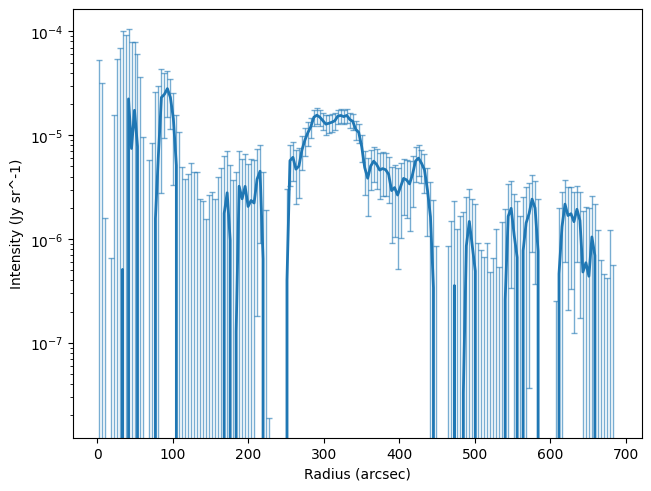

In [7]:
# A simple example plot of the nonaxisymmetric residuals for disk AA_Tau with robust value 0.5
# Adapting from section 4.2 of the exoALMA IV paper
# Keep the unit as Jy/beam at the moment, despite paper uses Jy/sr

cube = all_disks["AA_Tau"].get_cube("1.0", cube_type="residual")

x, y, dy = cube.radial_profile(inc=all_disks["AA_Tau"].inc, PA=all_disks["AA_Tau"].PA, unit='Jy/beam', dist=all_disks["AA_Tau"].distance_pc)  # return_au=False by default, so x is in arcsec
x=x * all_disks["AA_Tau"].distance_pc 
fig, ax = plt.subplots(constrained_layout=True)
# Plot the main line with a thicker width
ax.plot(x, y, color='C0', linewidth=2, label='Profile')
# Overlay lighter error bars
ax.errorbar(x, y, dy, fmt='none', ecolor='C0', alpha=0.6, elinewidth=1, capsize=2, label='Uncertainty')
ax.set_yscale('log')
ax.set_xlabel('Radius (arcsec)')  # nope, please be in au
ax.set_ylabel('Intensity (Jy sr^-1)')



# First , plot the full disk profile -> change the axes labels and calculations -> load the residuals 


And for the clean image to check if the result matches publication

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


Text(0, 0.5, 'Intensity (Jy beam^-1)')

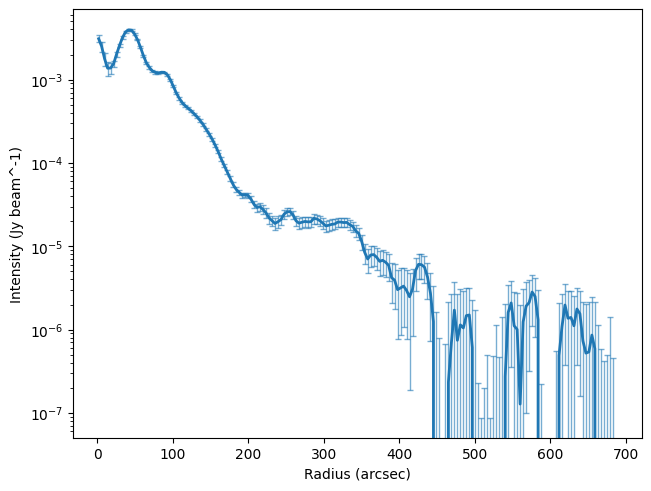

In [8]:
cube_cl = all_disks["AA_Tau"].get_cube("1.0", cube_type="clean")

x, y, dy = cube_cl.radial_profile(inc=all_disks["AA_Tau"].inc, PA=all_disks["AA_Tau"].PA, unit='Jy/beam')
x=x * all_disks["AA_Tau"].distance_pc 
fig, ax = plt.subplots(constrained_layout=True)
# Plot the main line with a thicker width
ax.plot(x, y, color='C0', linewidth=2, label='Profile')
# Overlay lighter error bars
ax.errorbar(x, y, dy, fmt='none', ecolor='C0', alpha=0.6, elinewidth=1, capsize=2, label='Uncertainty')
ax.set_yscale('log')
ax.set_xlabel('Radius (arcsec)')  # nope, please be in au
ax.set_ylabel('Intensity (Jy beam^-1)')




Checking that the plot_profile function in the DiskResidual class works.

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


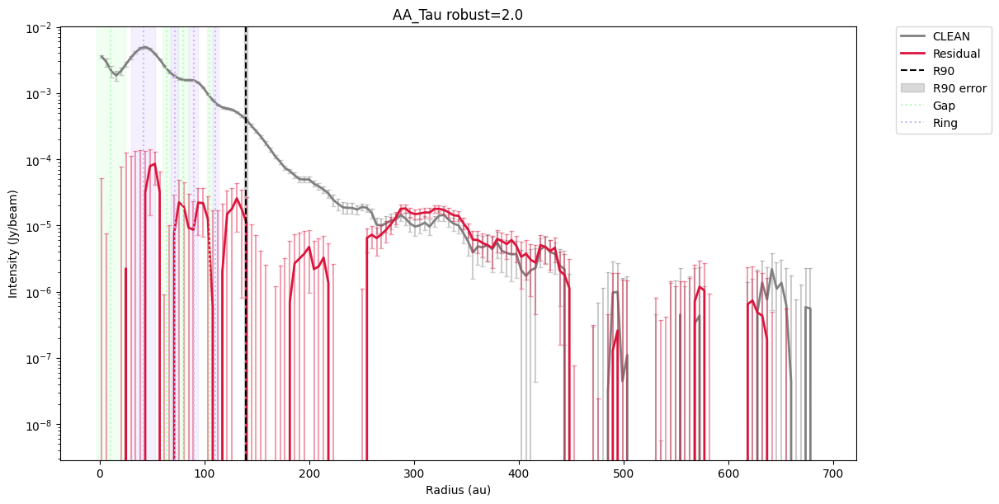

In [9]:
# unit transformation from Jy/beam to Jy/sr
# Jy/beam = Jy/sr * (beam area in sr)
# beam area extracted from the header of the FITS file

# --- IGNORE ---
# unit transformation from arcsec to au
# distance pc is NOT stored in the header of the FITS file


# Adapted from table 1 of the exoALMA X paper

all_disks["AA_Tau"].plot_profiles(robust_val="2.0", radius_unit="au", FOV  =20)


Plotting: AA_Tau
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


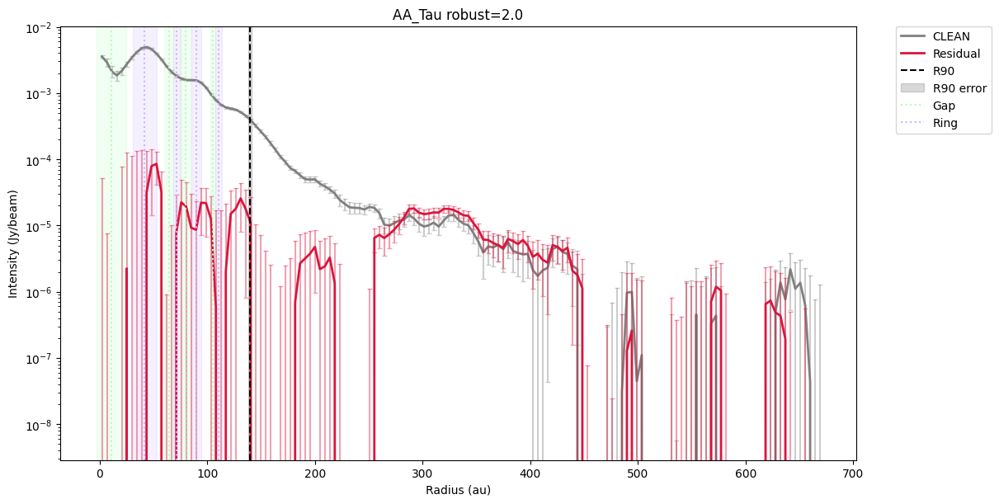

Plotting: CQ_Tau
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


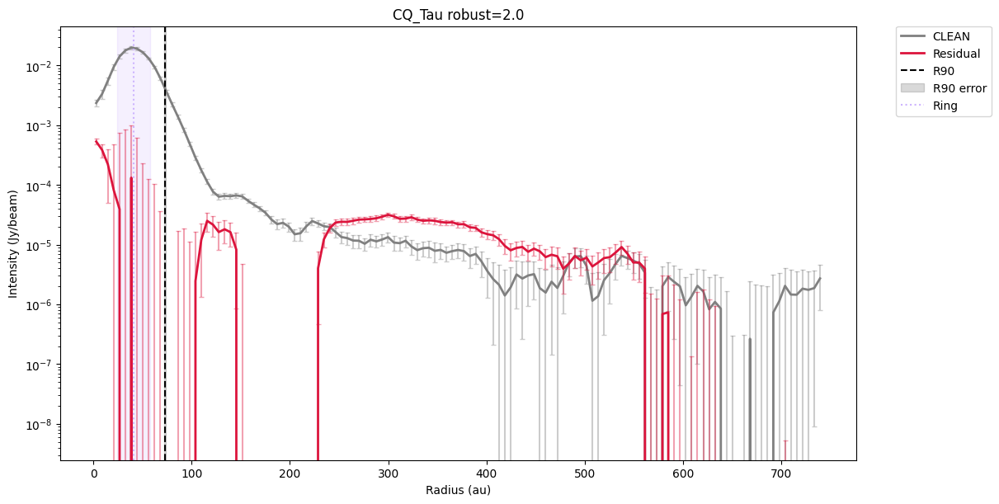

Plotting: DM_Tau
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


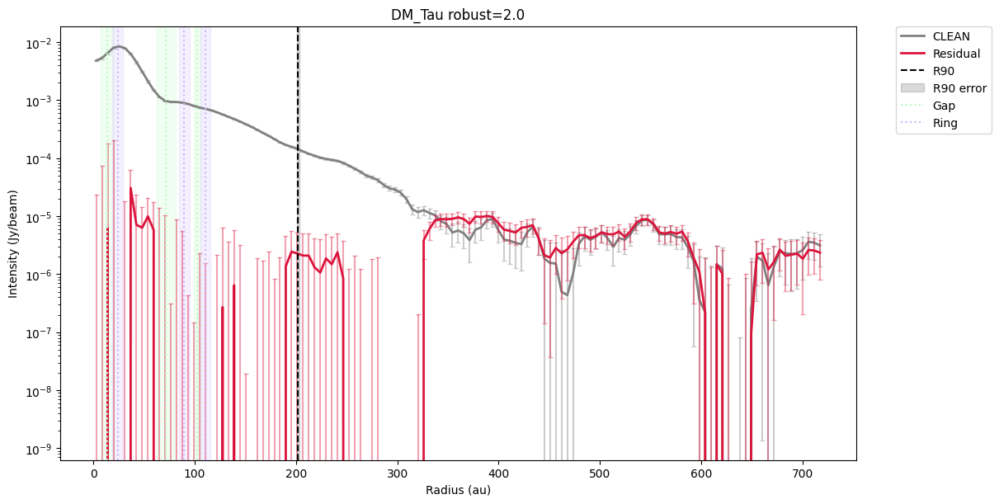

Plotting: HD_135344B
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


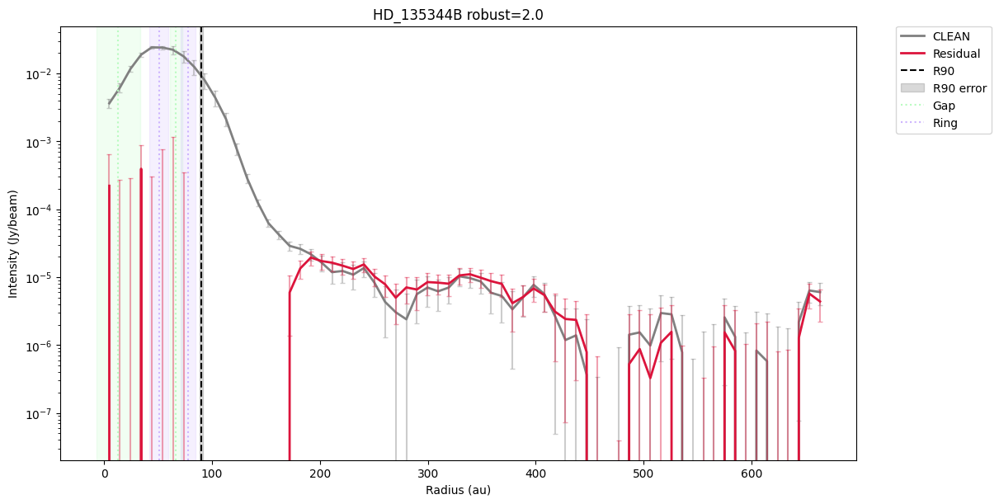

Plotting: HD_143006
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


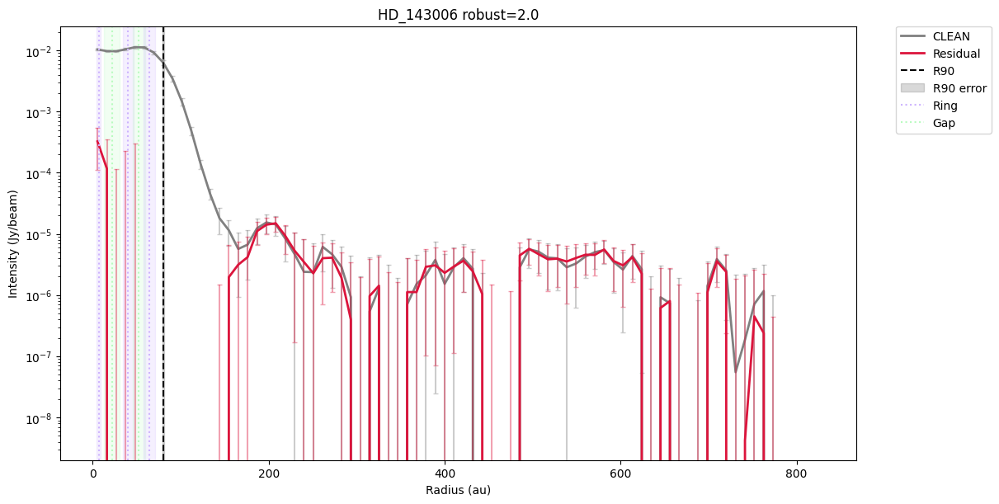

Plotting: HD_34282
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


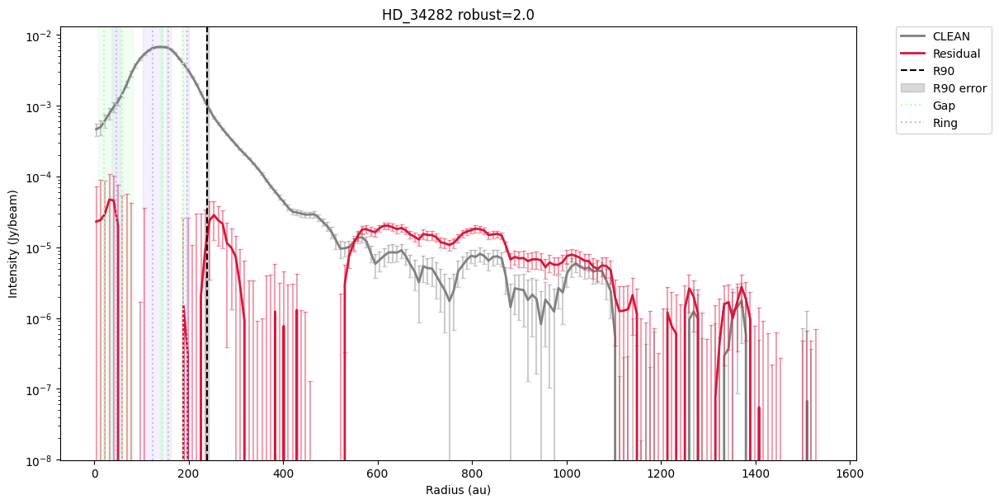

Plotting: J1604
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


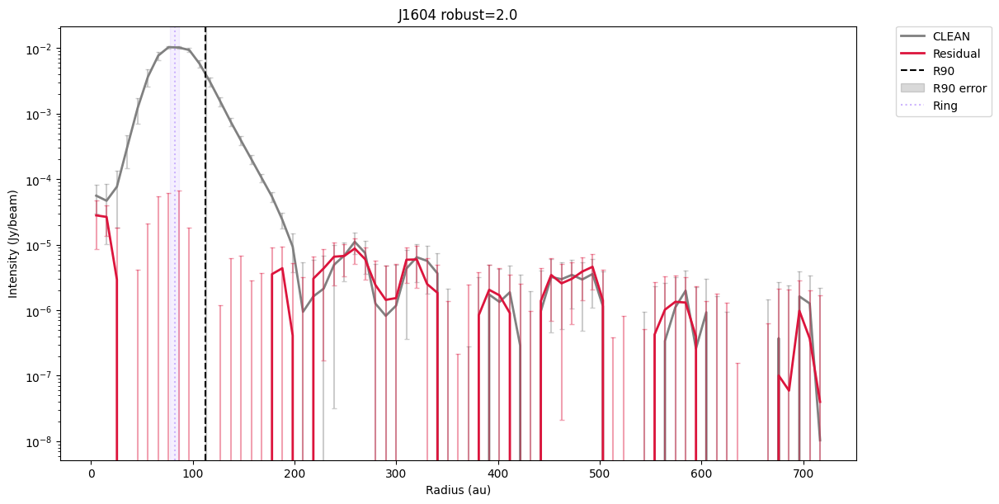

Plotting: J1615
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


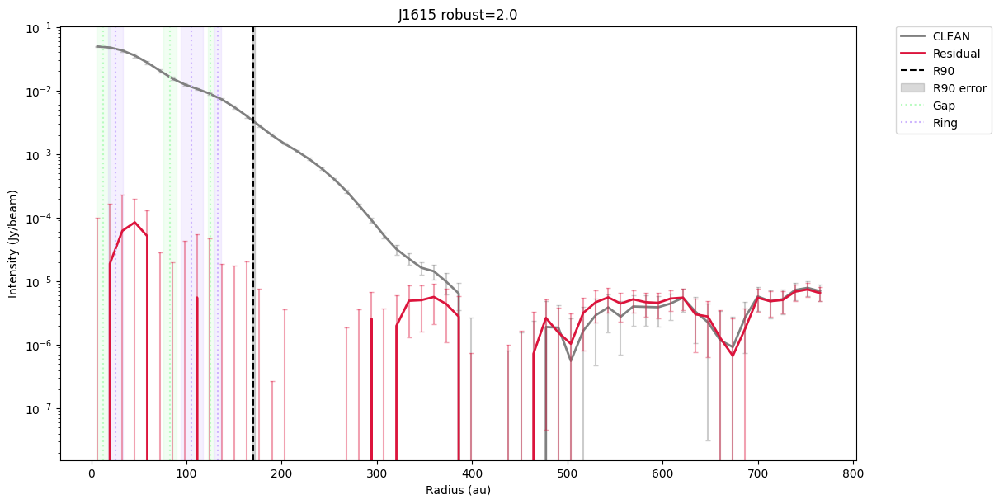

Plotting: J1842
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


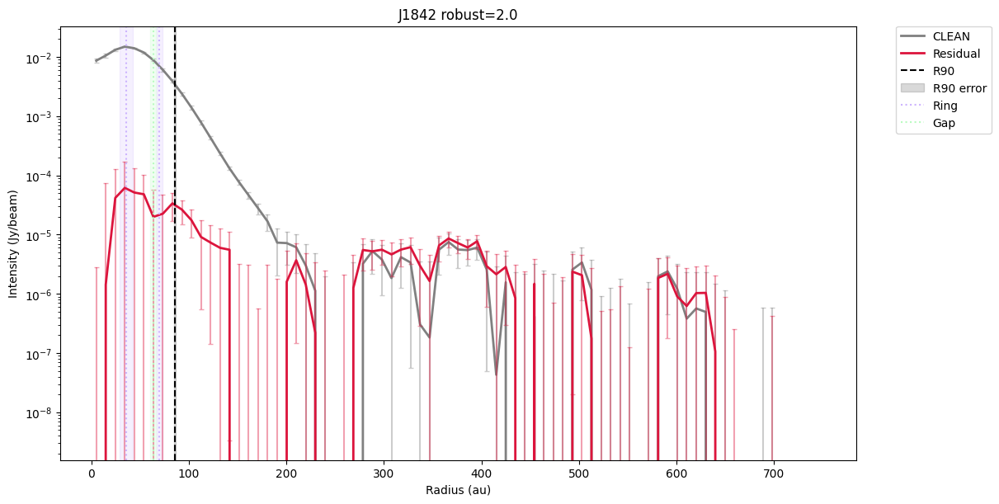

Plotting: J1852
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


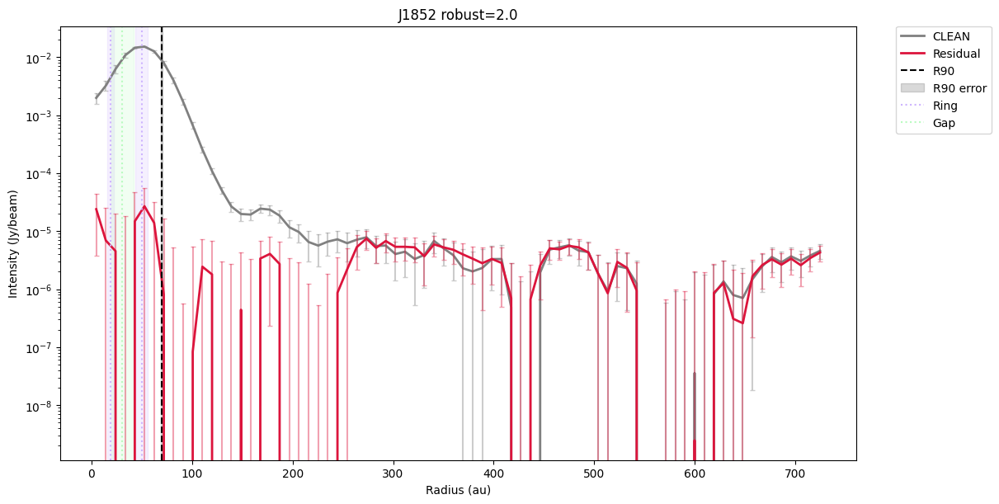

Plotting: LkCa_15
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


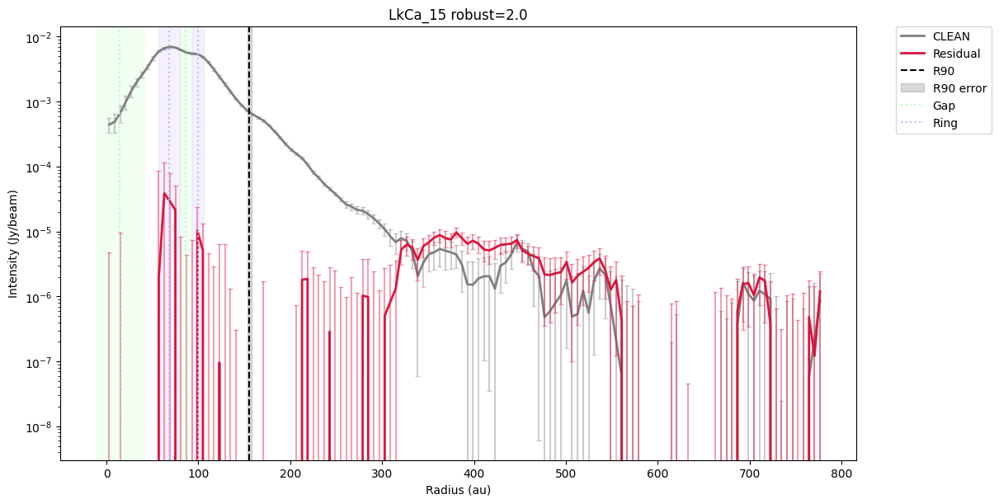

Plotting: MWC_758
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


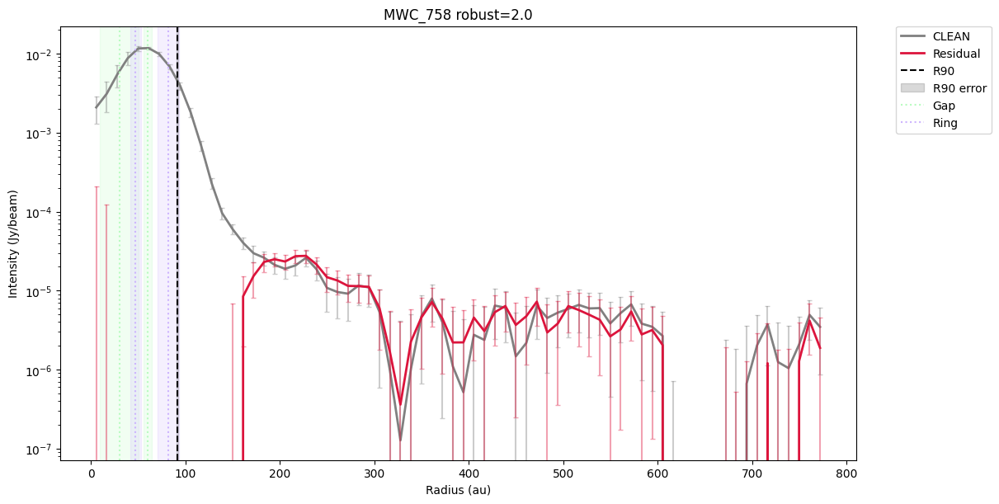

Plotting: PDS_66
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


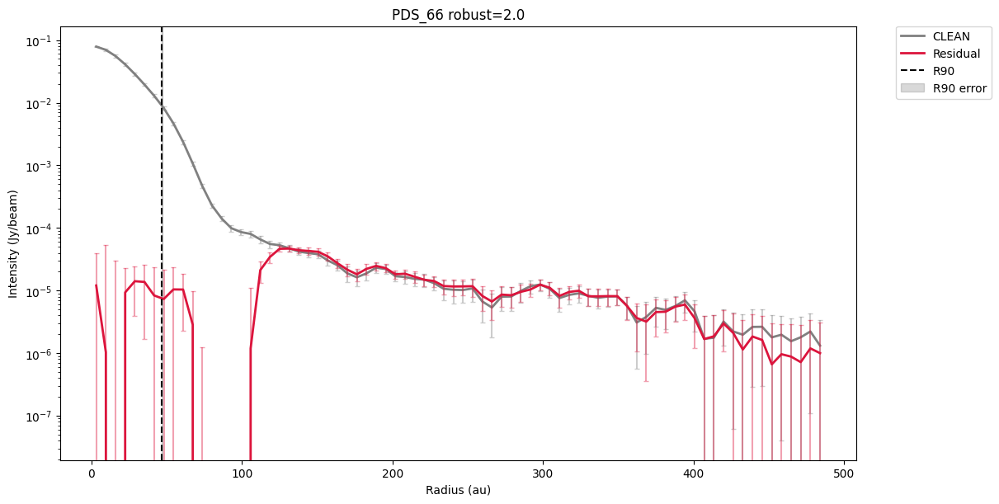

Plotting: SY_Cha
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


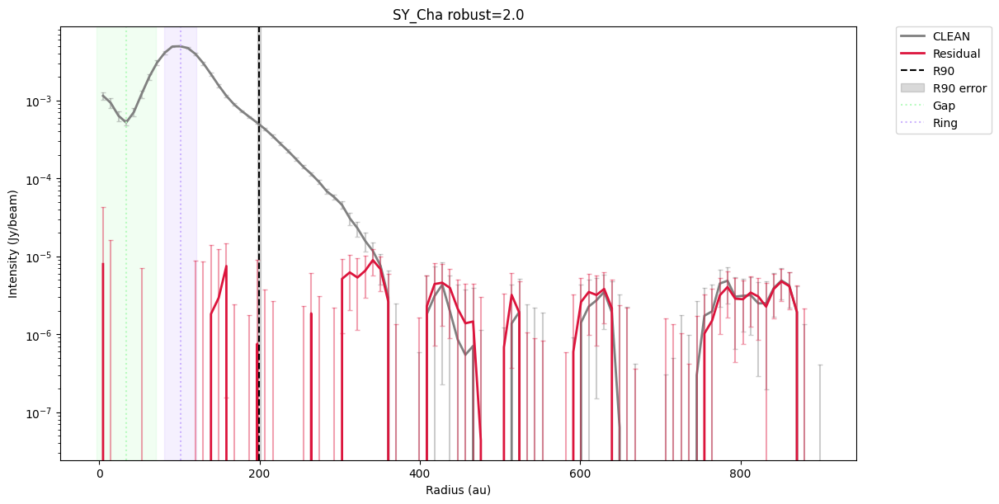

Plotting: V4046_Sgr
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


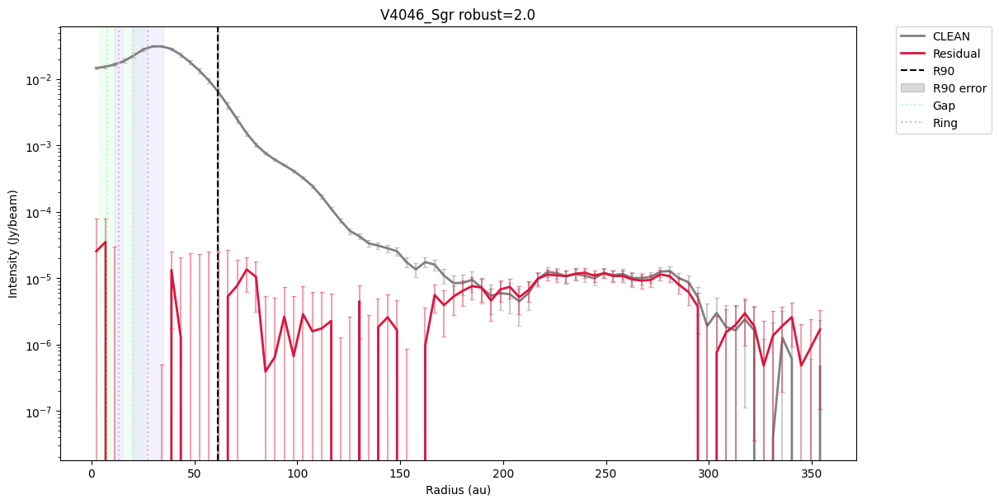

In [10]:
for disk_name, disk_obj in all_disks.items():
    print(f"Plotting: {disk_name}")
    disk_obj.plot_profiles(robust_val="2.0", radius_unit="au")

In [11]:
# Close all plots to save memory 
plt.close('all')

# Signal to Noise evaluation

### Radial Profile Noise and Masking: Key Considerations

A challenge arises because the radial profile is azimuthally averaged. Even if we extract the standard deviation in each annulus, it's unclear how to:

1. Translate that 1D profile back to a 2D map that applies to the clean image.
2. Use it to mask pixels accordingly.

Also, it's important to distinguish between the **standard deviation** and **dy**:

- **Standard deviation**:  
  Measures the spread of beam intensity values within each annulus — i.e., the **noise per beam** in that region.

- **dy**:  
  By default of gofish, represents the *uncertainty on the mean intensity* in each annulus, and is typically calculated as:

  $$
  dy = \frac{\text{std}}{\sqrt{N_{\text{beams}}}}
  $$


  where $ N_{\text{beams}} $ is the number of independent beams in the annulus.




### Radial Uncertainty Estimation in `gofish.py`

The following code snippet shows how the number of **independent beams** is estimated in each annulus:

```python
        # Account for the number of independent beams.
        # Correlation： beams within annulus overlap -> fewer independent pixels -> 
        # only number of beams matter for uncertainty
        # If the beams are assumed to be correlated , then we
        # multiply the number of beams by 2*pi*r/bmaj, which is the
        # number of beams in the annulus.

        if assume_correlated:
            nbeams = 2.0 * np.pi * rvals / self.bmaj  #scales the uncertainty
        else:
            nbeams = 1.0

               # Averaging.

        if percentiles:  
            rstat = np.array([np.percentile(toavg[ridxs == r], [16, 50, 84])  
                              for r in range(1, rbins.size)]).T
            ravgs = rstat[1]
            rstds = np.array([rstat[1] - rstat[0], rstat[2] - rstat[1]])  # the diff betweern the 
                                                                          # 16th and 50th percentiles, 
                                                                          # and the 50th and 84th percentiles
                                                                          #  as lower and upper uncertainties
            rstds /= np.sqrt(nbeams)[None, :]  # divide by the square root of the number of independent beams
        else:
            ravgs = np.array([np.mean(toavg[ridxs == r])
                              for r in range(1, rbins.size)])
            rstds = np.array([np.std(toavg[ridxs == r])
                              for r in range(1, rbins.size)])   # standard deviation of the pixels in 
                                                                #each radial bin
            rstds /= np.sqrt(nbeams)
        
```

I can also try setting `percentiles=True` in `_radial_profile_2D()` to estimate the residual standard deviation using the 16th–84th percentile range, instead of the standard deviation. This might be more robust if the distribution within bins is non-Gaussian.




### Compute the SNR mask

In [12]:
# Create a 2D sigma map for each disk (Briggs index 2.0)

for disk_name, disk_obj in all_disks.items():
    print(f"Creating sigma mask for: {disk_name}")
    
        # This is the correct method name and parameters
    sigma_2d, (x, y, dy) = disk_obj.create_sigma_mask(
        robust_val="2.0", 
        scale_factor=1.0,  # 3-sigma threshold
            save_fits=True     # Files are automatically saved
    )
        
    print(f" {disk_name}: Sigma mask created and saved")

Creating sigma mask for: AA_Tau
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
Saved sigma mask: Disk_Residual_Profile_Median_SNR\AA_Tau\AA_Tau_sigma_mask_robust2.0.fits
 AA_Tau: Sigma mask created and saved
Creating sigma mask for: CQ_Tau
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
Saved sigma mask: Disk_Residual_Profile_Median_SNR\CQ_Tau\CQ_Tau_sigma_mask_robust2.0.fits
 CQ_Tau: Sigma mask created and saved
Creating sigma mask for: DM_Tau
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
Saved sigma mask: Disk_Residual_Profile_Median_SNR\DM_Tau\DM_Tau_sigma_mask_robust2.0.fits
 DM_Tau: Sigma mask created and saved
Creating sigma mask for: HD_135344B
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
Saved sigma mask: Disk_Residual_Profile_Median_SNR\HD_135344B\HD_135344B_sigma_mask_robust2.0.fits
 HD_135344B: Sigma mask created and saved
Creating sigma mask for: HD_143006
	 Reverti

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


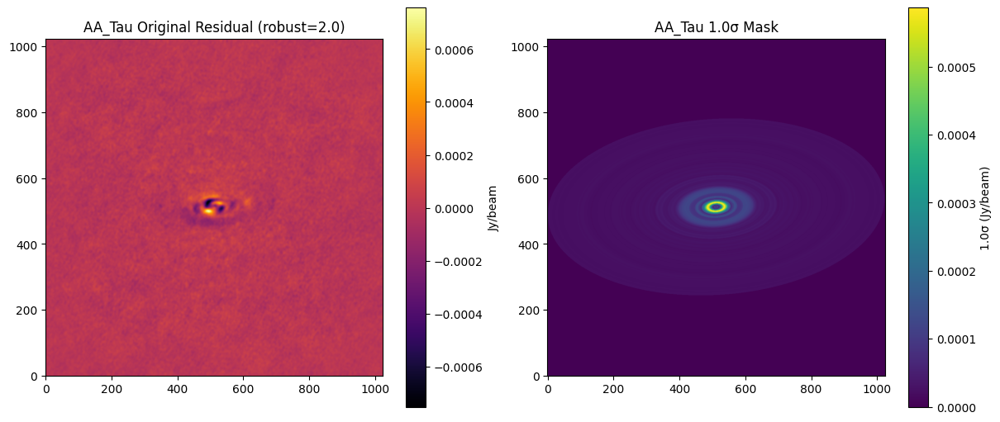

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


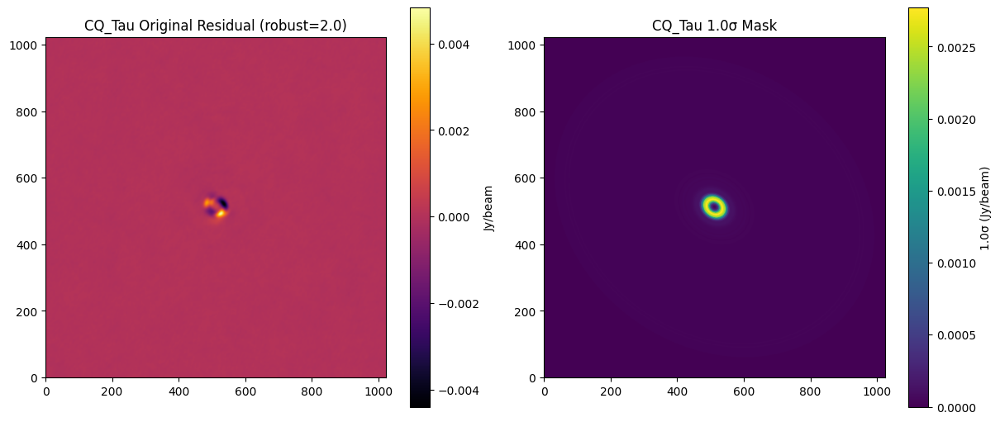

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


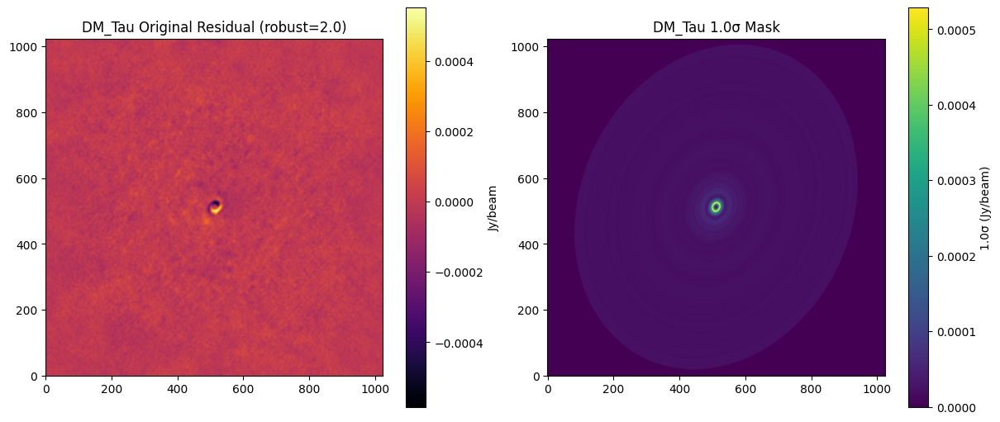

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


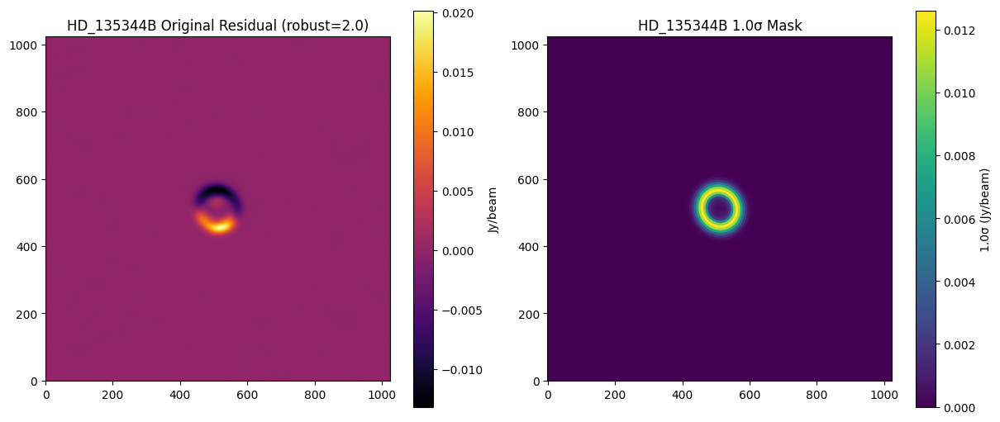

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


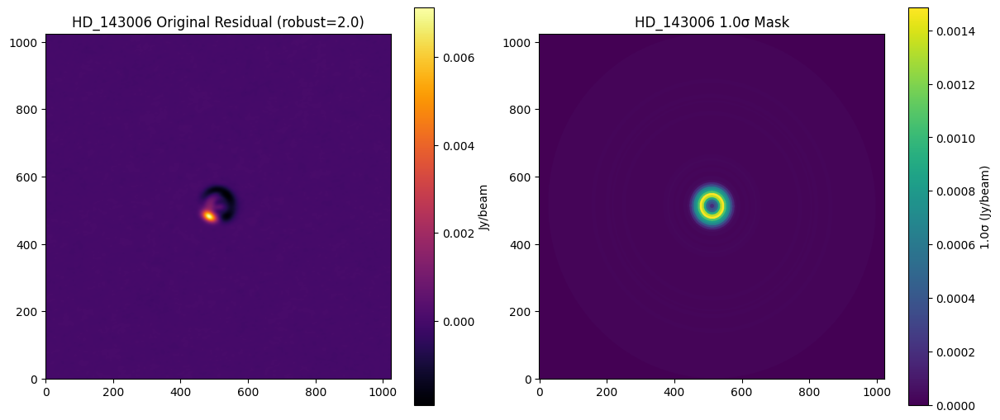

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


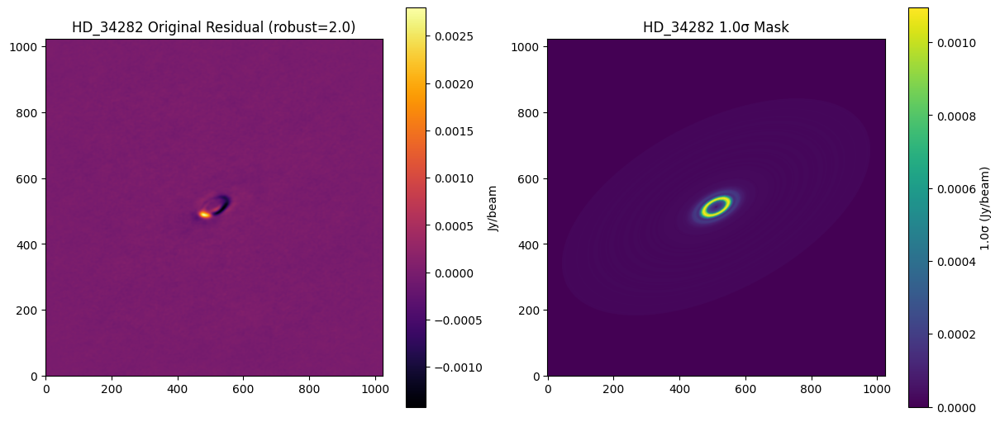

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


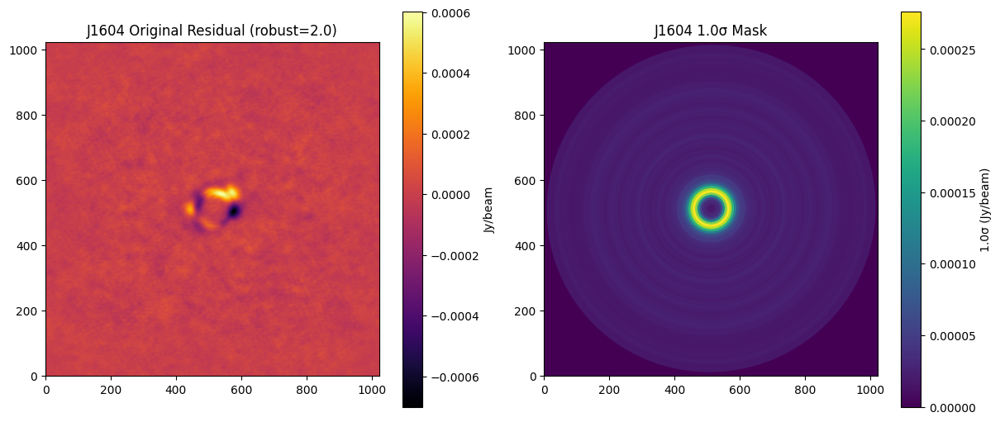

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


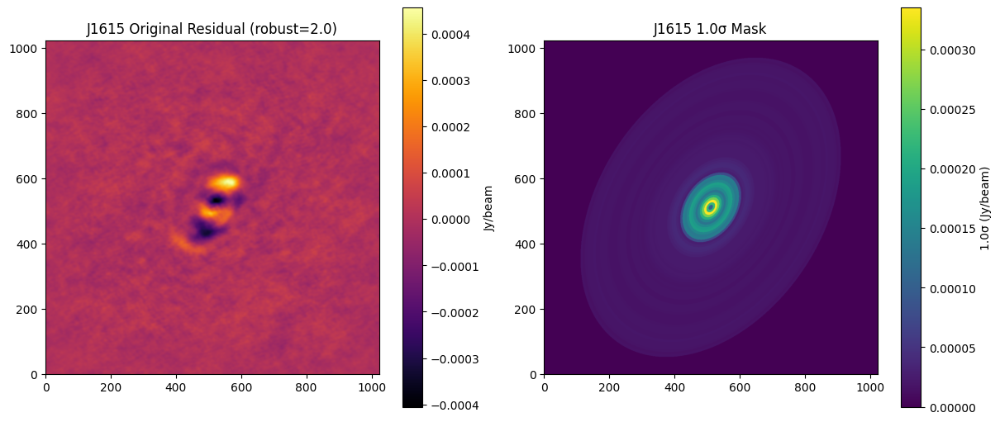

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


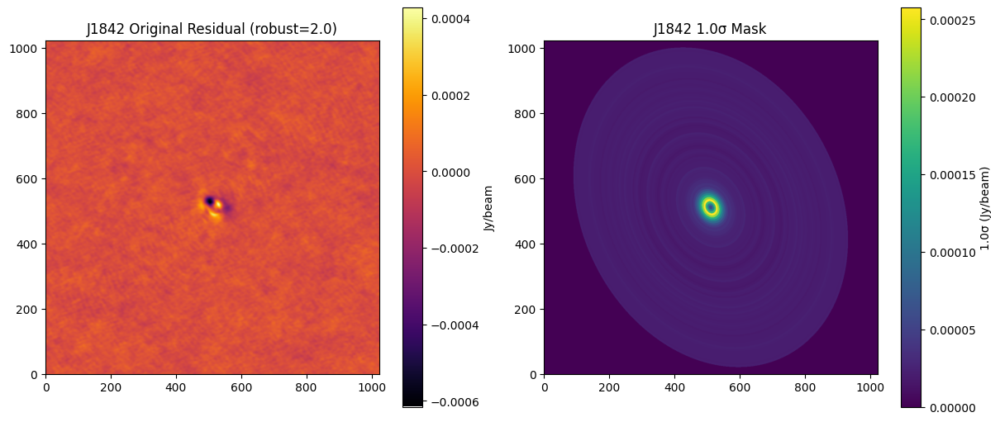

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


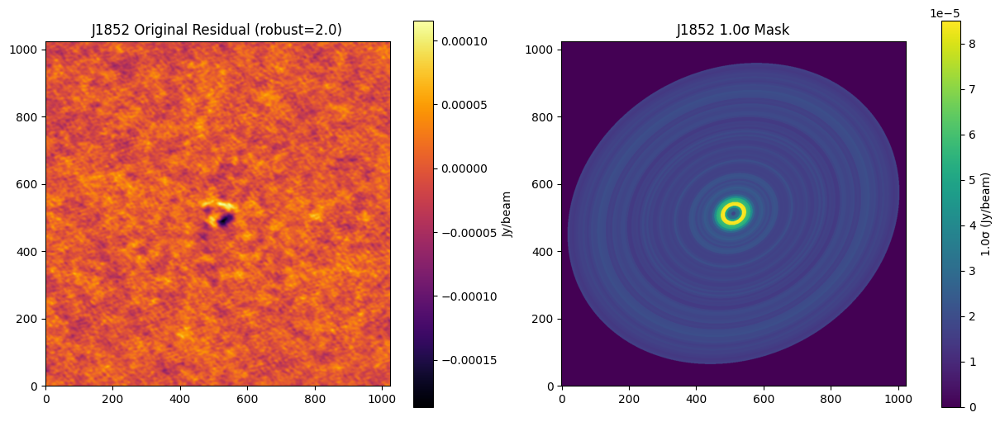

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


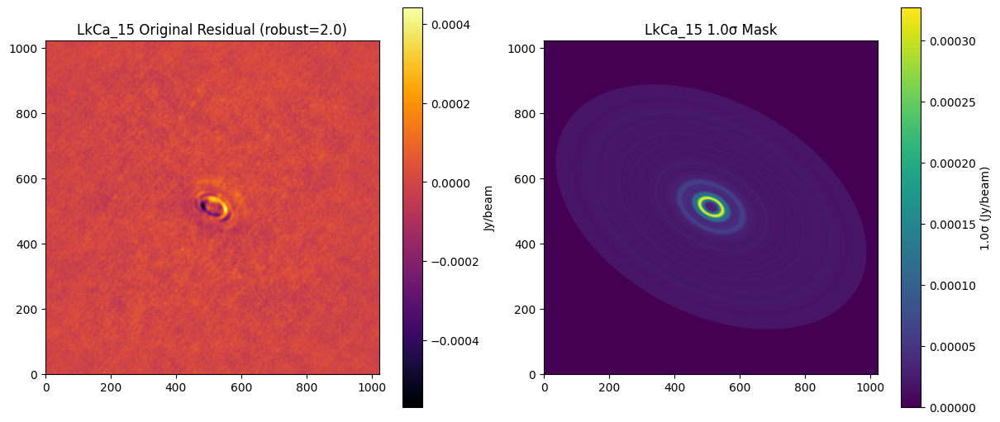

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


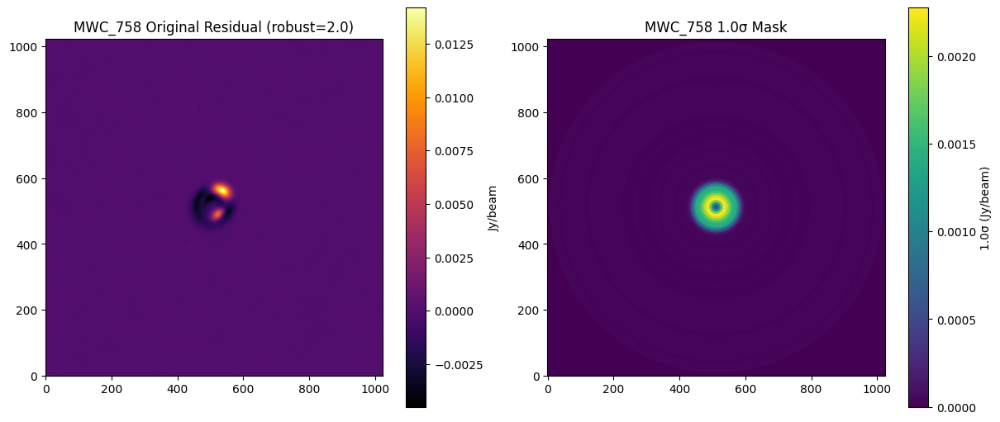

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


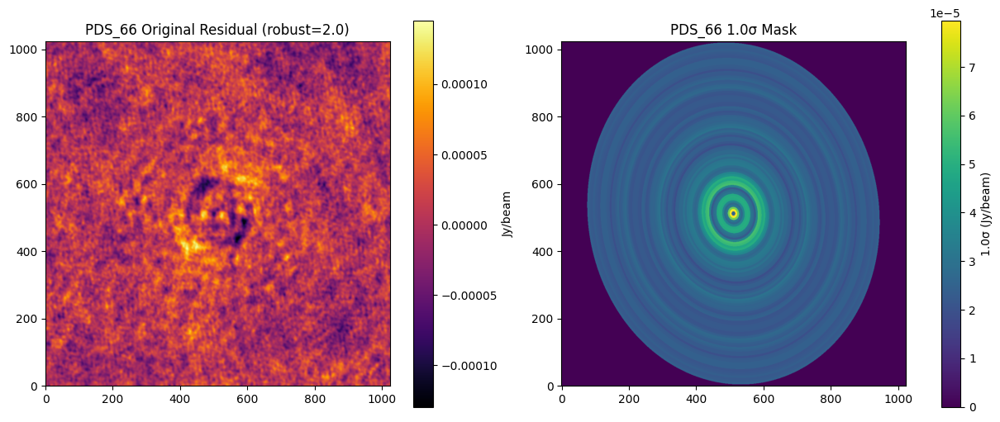

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


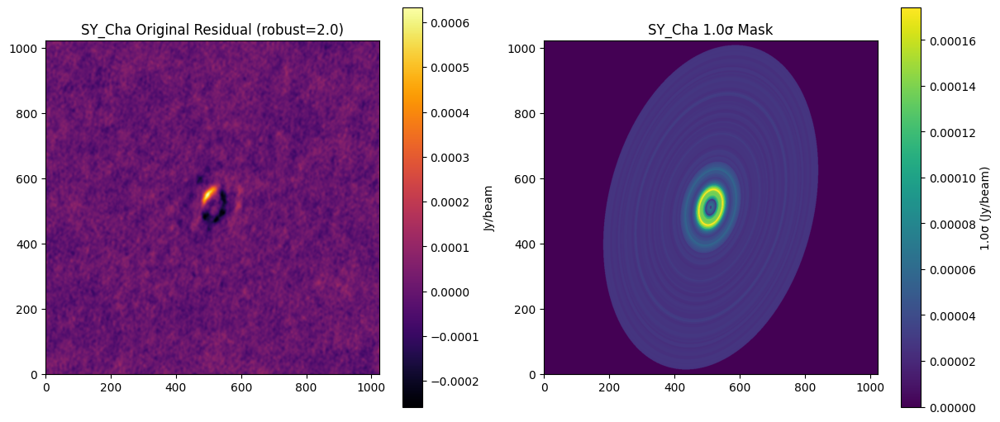

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.


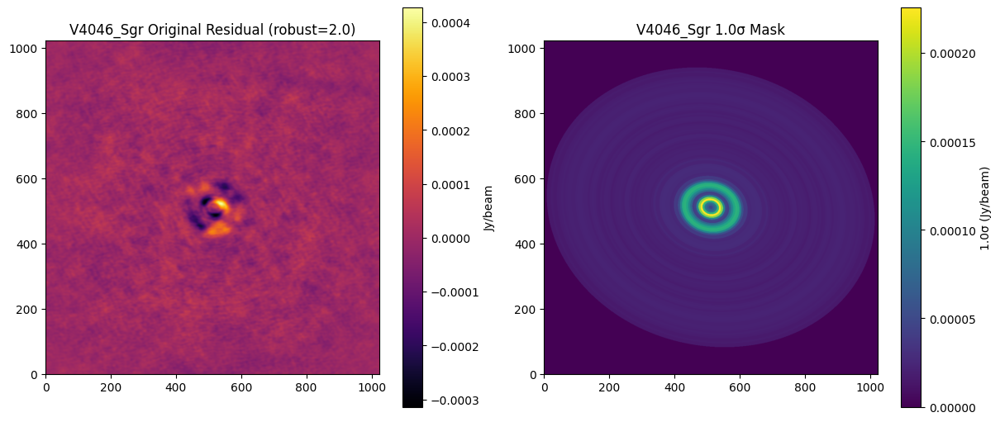

In [13]:
# Plot them  side by side

for disk_name, disk_obj in all_disks.items():
    
    disk_obj.plot_sigma_comparison(robust_val="2.0", scale_factor=1.0)
        


In [14]:
# Close all plots to save memory
plt.close('all')



Question: If the background has negative residual intensity, but there’s a local emission source within it that is significantly brighter (SNR > 5),  would using a high SNR threshold still be reliable for source detection? Or could it lead to missed detections because of the negative background?


If I use the absolute value of the SNR as a threshold, I might not be able to distinguish a truly positive signal within a gap—,since its SNR would be negative,rom a deep negative residual caused solely by the gap itself, with no embedded source.

In [15]:
# Create a 2D SNR map for each disk (Briggs index 2.0)

# Use the actual key format that exists
for disk_name, disk_obj in all_disks.items():
    print(f"Creating SNR map for: {disk_name}")
    
    snr_2d = disk_obj.create_snr_map(robust_val="2.0")  
    
    if snr_2d is not None:
        print(f" {disk_name}: SNR map created successfully")
    else:
        print(f" {disk_name}: Failed to create SNR map")

Creating SNR map for: AA_Tau
  AA_Tau: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
 AA_Tau: SNR map created successfully
Creating SNR map for: CQ_Tau
  CQ_Tau: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
 CQ_Tau: SNR map created successfully
Creating SNR map for: DM_Tau
  DM_Tau: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
 DM_Tau: SNR map created successfully
Creating SNR map for: HD_135344B
  HD_135344B: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
 HD_135344B: SNR map created successfully
Creating SNR map for: HD_143006
  HD_143006: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
 HD_143006: SNR map created successfully
Creating SNR map for: HD_34282
  HD_34282: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
 HD_34282: SNR map created successfully
Creating SNR map for: J1604
  J1604: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
 J1604: SNR map created successfully
Creating SNR map for: J1615
  J1615: Sigma sh

### Run source detection

**1. Run the photutil source detection**

**2. Save the summary into txt and dataframes**

**3. Plot the contoured SNR map**

The next step is to run the source detection algorithm across all robust values to inspect if the high SNR source appears repeatedly. There are two tasks to accomplish:

1. Ensure the field of view of both the residual map and the residual profile matches that of the original image.

2. Double-check the parameters used for source detection and explore alternative methods for source detection.

    Alternatively, a more straightforward approach is to save the SNR map (after ensuring the SNR is computed reliably and accurately) to a FITS (construct the header with caution, not just copy clean image header) and manually contour the high SNR region using CARTA.

In [16]:
# Run the source detection function for all robust values and thresholds (3.0 and 5.0)
robust_vals = ["-2.0", "-1.5", "-1.0", "-0.5", "0.0", "0.5", "1.0", "1.5", "2.0"]
thresholds = [3.0, 5.0]

for disk_name, disk_obj in all_disks.items():
    for r in robust_vals:
        resid_path = os.path.join("D:/exoALMA_disk_data", disk_name,
                                  "images_frank_residuals_different_robust",
                                  f"{disk_name}_continuum_resid_robust{r}.image.fits")
        if not os.path.exists(resid_path):
            print(f"Skipping {disk_name} (robust {r}): residual file not found.")
            continue
        try:
            disk_obj.create_sigma_mask(robust_val=r, scale_factor=1.0, save_fits=True)
            snr_map = disk_obj.create_snr_map(robust_val=r)
            if snr_map is not None:
                for t in thresholds:
                    disk_obj.source_detection(snr_map, robust_val=r, threshold=t)  # will skip if file exists
        except Exception as e:
            print(f"Error processing {disk_name} (robust {r}): {e}")

	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
Saved sigma mask: Disk_Residual_Profile_Median_SNR\AA_Tau\AA_Tau_sigma_mask_robust-2.0.fits
  AA_Tau: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
  Catalog exists, skipping: Disk_Residual_Profile_Median_SNR\AA_Tau\robust_-2.0\source_catalog_AA_Tau_robust-2.0_thresh3p0.txt
  Pixel scale: 1.4 AU/pixel
  No sources detected above 5.0σ
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
Saved sigma mask: Disk_Residual_Profile_Median_SNR\AA_Tau\AA_Tau_sigma_mask_robust-1.5.fits
  AA_Tau: Sigma shape: (1024, 1024), Residual shape: (1024, 1024)
  Catalog exists, skipping: Disk_Residual_Profile_Median_SNR\AA_Tau\robust_-1.5\source_catalog_AA_Tau_robust-1.5_thresh3p0.txt
  Catalog exists, skipping: Disk_Residual_Profile_Median_SNR\AA_Tau\robust_-1.5\source_catalog_AA_Tau_robust-1.5_thresh5p0.txt
	 Reverting to standard azimuthal averaging; will ignore `unit` argument.
Saved sigma mask: Di

In [ ]:
from IPython.display import display

for disk_name, disk_obj in all_disks.items():
    print(f"\n=== {disk_name} ===")
    #df = DiskResiduals.complete_source_detection_summary(disk)
    df = disk_obj.complete_source_detection_summary()
    display(df)             


=== AA_Tau ===


,Robust,3σ,5σ
0,-2.0,211.0,NaN
1,-1.5,208.0,1.0
2,-1.0,201.0,NaN
3,-0.5,191.0,NaN
4,0.0,167.0,NaN
5,0.5,135.0,NaN
6,1.0,153.0,1.0
7,1.5,NaN,NaN
8,2.0,140.0,3.0



=== CQ_Tau ===


,Robust,3σ,5σ
0,-2.0,290,6
1,-1.5,291,7
2,-1.0,278,7
3,-0.5,280,7
4,0.0,264,8
5,0.5,203,10
6,1.0,184,3
7,1.5,250,4
8,2.0,262,3



=== DM_Tau ===


,Robust,3σ,5σ
0,-2.0,315,NaN
1,-1.5,316,NaN
2,-1.0,317,NaN
3,-0.5,308,1.0
4,0.0,235,1.0
5,0.5,214,1.0
6,1.0,194,NaN
7,1.5,204,1.0
8,2.0,215,1.0



=== HD_135344B ===


,Robust,3σ,5σ
0,-2.0,237,2.0
1,-1.5,244,2.0
2,-1.0,225,2.0
3,-0.5,198,2.0
4,0.0,124,1.0
5,0.5,111,2.0
6,1.0,115,NaN
7,1.5,111,NaN
8,2.0,99,NaN



=== HD_143006 ===


,Robust,3σ,5σ
0,-2.0,218,15
1,-1.5,230,20
2,-1.0,221,14
3,-0.5,211,12
4,0.0,169,1
5,0.5,140,21
6,1.0,149,38
7,1.5,146,42
8,2.0,147,47



=== HD_34282 ===


,Robust,3σ,5σ
0,-2.0,217,1.0
1,-1.5,221,1.0
2,-1.0,217,1.0
3,-0.5,214,NaN
4,0.0,194,1.0
5,0.5,155,1.0
6,1.0,166,2.0
7,1.5,196,3.0
8,2.0,206,2.0



=== J1604 ===


,Robust,3σ,5σ
0,-2.0,274,1
1,-1.5,277,1
2,-1.0,272,1
3,-0.5,248,1
4,0.0,223,2
5,0.5,177,22
6,1.0,159,32
7,1.5,124,30
8,2.0,130,31



=== J1615 ===


,Robust,3σ,5σ
0,-2.0,188,NaN
1,-1.5,184,NaN
2,-1.0,183,NaN
3,-0.5,165,NaN
4,0.0,117,NaN
5,0.5,130,NaN
6,1.0,152,12.0
7,1.5,170,13.0
8,2.0,158,15.0



=== J1842 ===


,Robust,3σ,5σ
0,-2.0,205,NaN
1,-1.5,201,1.0
2,-1.0,202,NaN
3,-0.5,192,NaN
4,0.0,156,1.0
5,0.5,141,NaN
6,1.0,100,NaN
7,1.5,87,NaN
8,2.0,85,NaN



=== J1852 ===


,Robust,3σ,5σ
0,-2.0,272,None
1,-1.5,265,None
2,-1.0,269,None
3,-0.5,185,None
4,0.0,153,None
5,0.5,127,None
6,1.0,88,None
7,1.5,99,None
8,2.0,83,None



=== LkCa_15 ===


,Robust,3σ,5σ
0,-2.0,255,3.0
1,-1.5,253,3.0
2,-1.0,241,3.0
3,-0.5,232,1.0
4,0.0,225,NaN
5,0.5,164,NaN
6,1.0,142,NaN
7,1.5,172,1.0
8,2.0,173,NaN



=== MWC_758 ===


,Robust,3σ,5σ
0,-2.0,367,97
1,-1.5,361,94
2,-1.0,357,94
3,-0.5,334,97
4,0.0,262,86
5,0.5,266,95
6,1.0,251,100
7,1.5,251,95
8,2.0,263,88



=== PDS_66 ===


,Robust,3σ,5σ
0,-2.0,224,1.0
1,-1.5,226,NaN
2,-1.0,212,NaN
3,-0.5,183,NaN
4,0.0,157,NaN
5,0.5,132,NaN
6,1.0,171,NaN
7,1.5,283,NaN
8,2.0,257,3.0



=== SY_Cha ===


,Robust,3σ,5σ
0,-2.0,218,1.0
1,-1.5,215,1.0
2,-1.0,201,1.0
3,-0.5,166,NaN
4,0.0,153,NaN
5,0.5,100,NaN
6,1.0,106,NaN
7,1.5,111,NaN
8,2.0,96,NaN



=== V4046_Sgr ===


,Robust,3σ,5σ
0,-2.0,230,1.0
1,-1.5,227,1.0
2,-1.0,228,1.0
3,-0.5,204,1.0
4,0.0,178,1.0
5,0.5,160,NaN
6,1.0,192,7.0
7,1.5,167,10.0
8,2.0,177,7.0


A negative value of the Briggs index corresponds to uniform weighting, which provides higher resolution but lower sensitivity. This means that features with high signal-to-noise ratios (SNR) are more likely to be noise. A value of 0.0 represents a balanced trade-off between resolution and sensitivity. Therefore, sources like V4046 Sgr and LkCa 15 are more likely to show noise artifacts, while <span style="color:red"> AA Tau, CQ Tau, HD 135344B, HD 34282, and MWC 758 <span> may contain real features. 


MWC 758:
I suspect the residual feature here is consistent, but it spans a large area that isn’t fully connected. This gives the appearance of several sources; however, I believe they all belong to the same patch of asymmetry just outside the R90 radius. It’s unlikely to be a CPD (circumplanetary disk) source, as the structure is too large for that interpretation.

CQ Tau:
The feature is located very close to the center, at a radius of about 7 AU. It appears to be quite consistent, spanning roughly 30 to 80 pixels, and lies well within what I’d describe as a spiral-like residual structure.

HD 135344B:
Once again, the feature appears very close to the center — approximately 1 AU — and spans around 30 pixels. It’s likely the pink patch visible in the residual image from ExoALMA4. I'm not sure what it represents, but if it is definitely not noise, i dont know why it doesnt appear in higher robust value images.

HD 34282:
There appear to be two distinct sources in the residuals. One lies approximately 900 AU from the center, and the other around 1560 AU. Both are very compact—about 1–2 pixels in size—which is consistent with the expected scale of a CPD (circumplanetary disk). In the contour image of HD 34282, however, only one of these features is visible, appearing as a small dot; I couldn't locate the second one. Notably, these features are well outside the main asymmetric structures in the disk, which makes them particularly interesting and worth noting, even if their nature remains unclear.


AA Tau:
AA Tau is somewhat ambiguous. There's only one detected source across two of the robust values (1.0 and 2.0), while it’s missing in the 1.5 robust case. However, by location, the detections align — they appear at the same radius, roughly 590 AU from the center, and span about 2–3 pixels. Looking at the residual image, the source is visible and situated among several 3σ emission features. Notably, the background beyond this region appears relatively clean, with few large noise patches.

The other thing to consider is ensuring that the SNR map is computed and clipped appropriately. Although, technically, dividing the residual map by the noise should work. I’m not entirely sure if there are additional ways to confirm that the detected feature is indeed related to planet formation and not simply the result of a miscalculation or artifact. and  match gas.

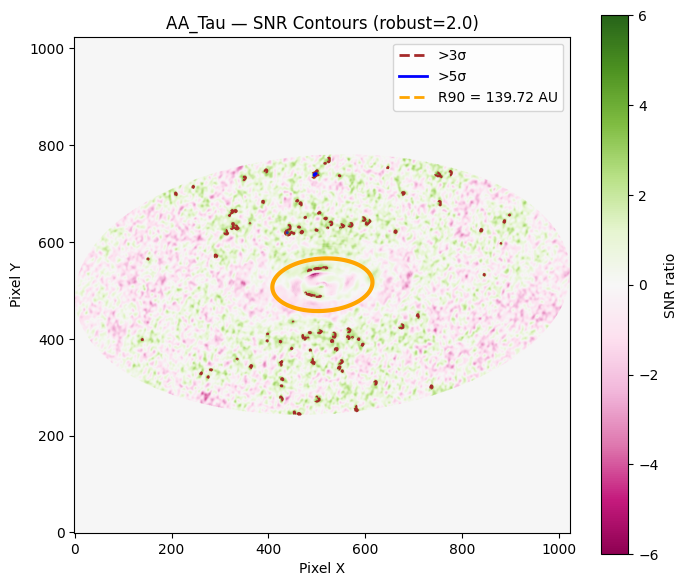

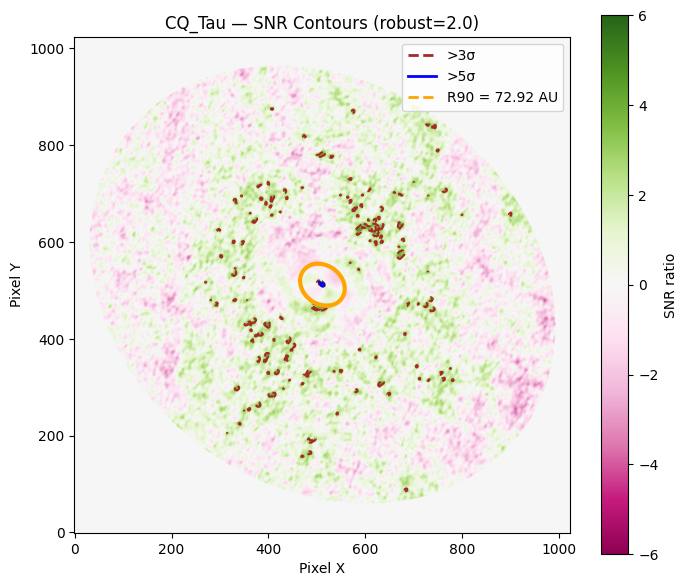

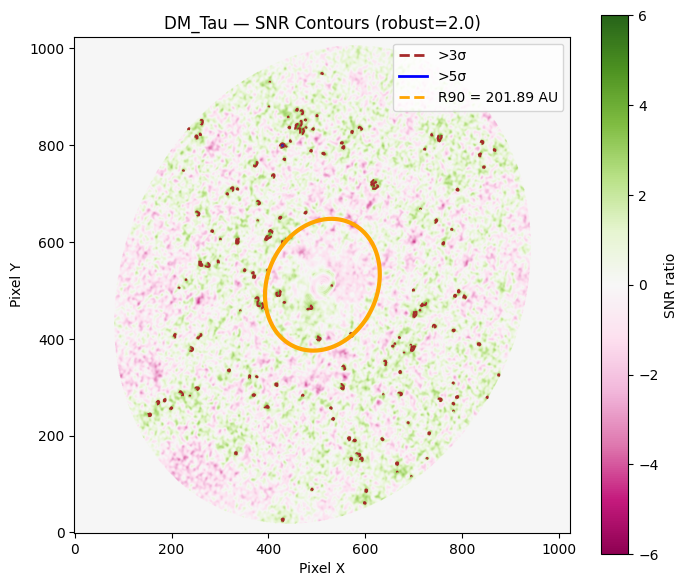

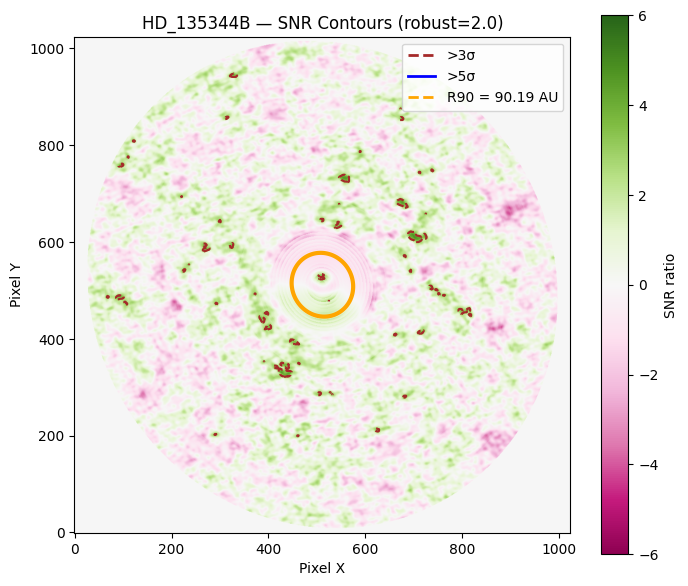

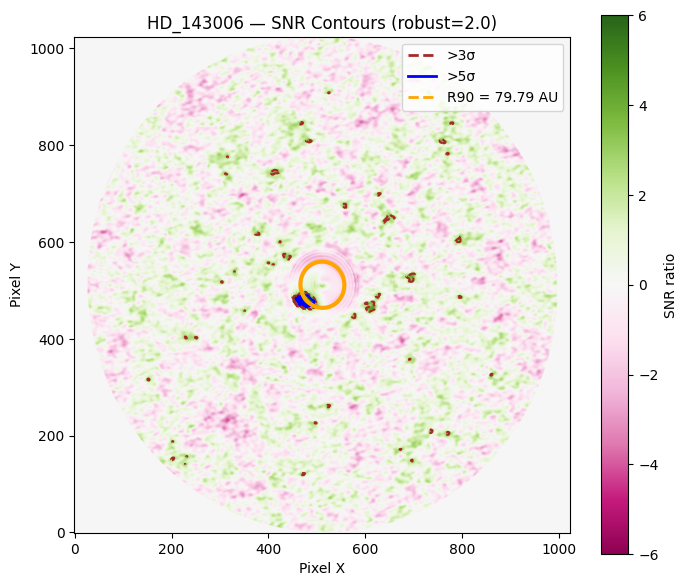

...

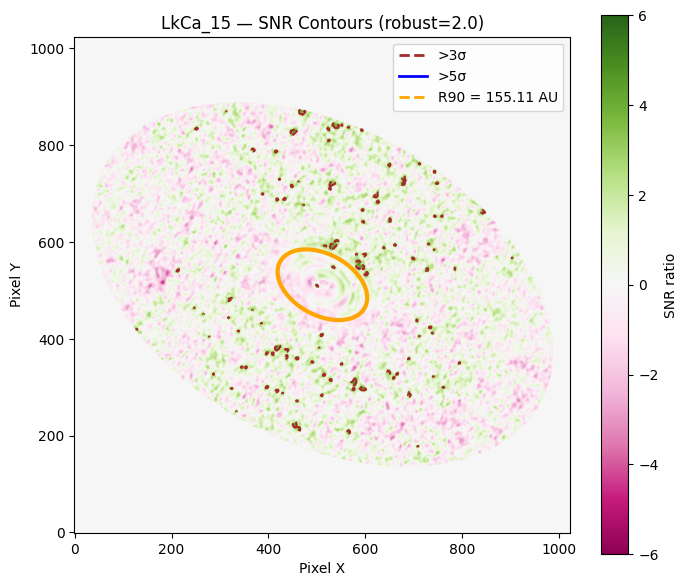

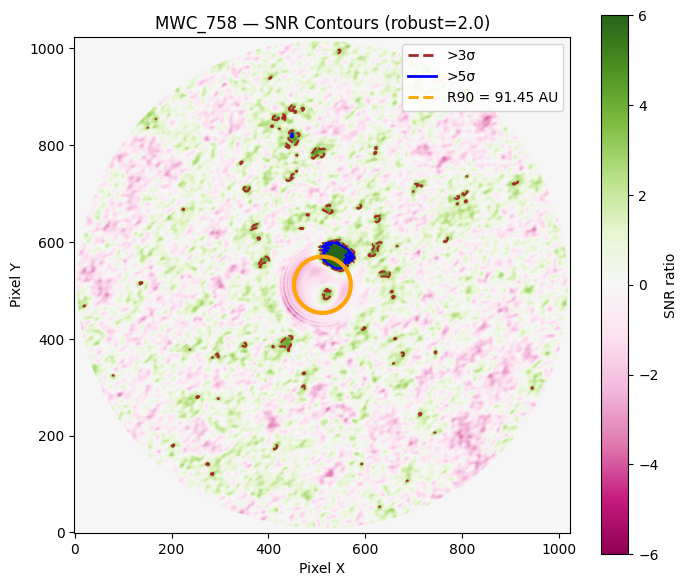

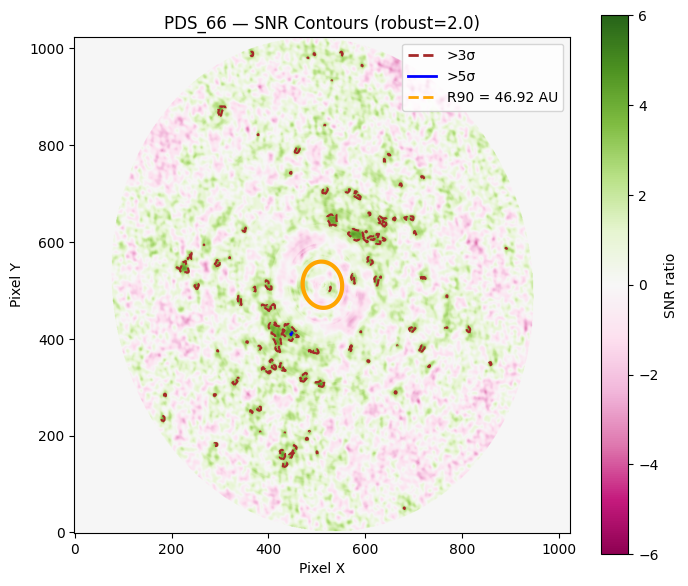

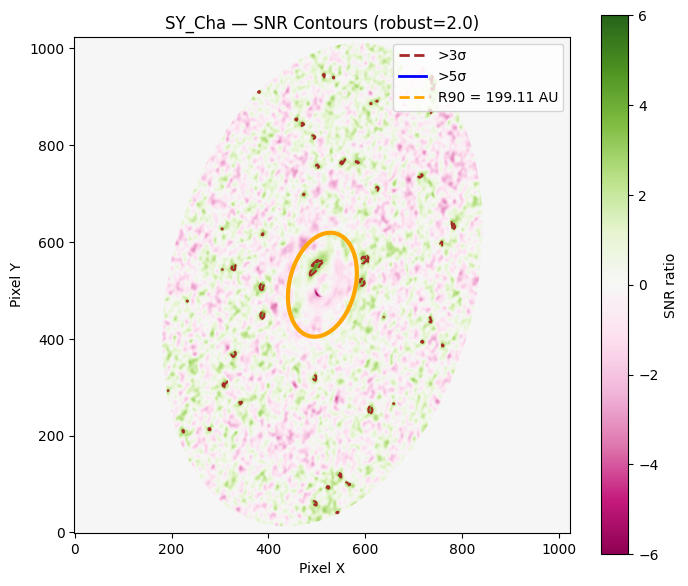

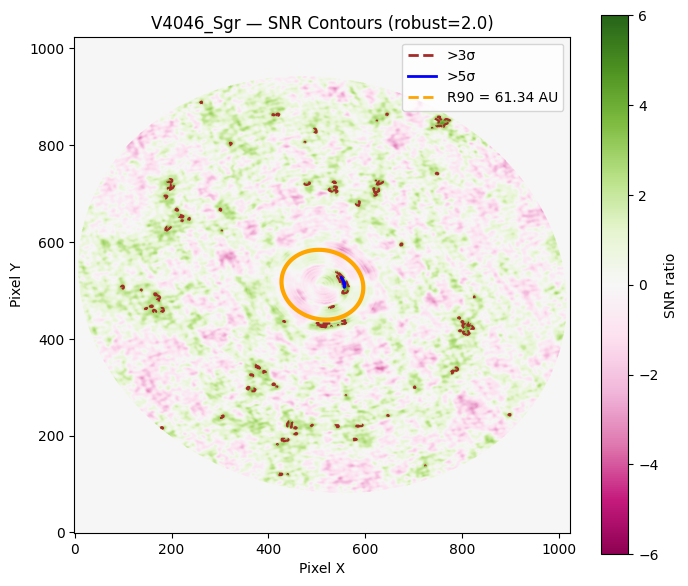

In [18]:
# Now Plot the source detection results and plot the radial distrubtion of sources

def plot_snr_map_simple(disk_name, robust_val):
    """
    Plot simplified SNR map with 3 sigma  and 5 sigma contours.

    """
    snr_map = all_disks[disk_name].snr_maps[robust_val]

    # Create binary masks for 3σ and 5σ
    mask_3sigma = snr_map >= 3.0
    mask_5sigma = snr_map >= 5.0

    cube = all_disks[disk_name].get_cube(robust_val, cube_type="residual")
    pixel_scale_arcsec = abs(cube.header['CDELT1']) * 3600
    r90 = all_disks[disk_name].disksize["R90"]  # in arcsec
    r90_au = r90 * all_disks[disk_name].distance_pc  # convert to au

    

    rmap = cube.disk_coords(
        inc=all_disks[disk_name].inc,
        PA=all_disks[disk_name].PA
    )[0]  # radial map in pixels


    


    # Plot
    plt.figure(figsize=(8, 7))
    plt.imshow(snr_map,origin = 'lower', cmap='PiYG', vmin = -6, vmax=6) 
    plt.colorbar(label='SNR ratio')
    
    # Contours
    #levels = [0.5]  # Contour level for binary mask
    plt.contour(mask_3sigma, levels=[0.5], colors='brown', linewidths=1.5, linestyles='--', label='>3 sigma')
    plt.contour(mask_5sigma, levels=[0.5], colors='blue', linewidths=1.5, linestyles='-', label='>5 sigma')

    plt.contour(rmap, levels=[r90], colors='orange', linewidths=3, linestyles='-')

    plt.title(f"{disk_name} — SNR Contours (robust={robust_val})")
    plt.xlabel("Pixel X")
    plt.ylabel("Pixel Y")
    plt.grid(False)

    # Legend (manual)
    from matplotlib.lines import Line2D
    custom_lines = [
        Line2D([0], [0], color='brown', lw=2, linestyle='--', label='>3σ'),
        Line2D([0], [0], color='blue', lw=2, linestyle='-', label='>5σ'),
        Line2D([0], [0], color='orange', lw=2, linestyle='--', label=f'R90 = {r90_au:.2f} AU')
    ]
    plt.legend(handles=custom_lines, loc='upper right')


for disk_name, disk_obj in all_disks.items():
        plot_snr_map_simple(disk_name, "2.0")
        plt.show()  

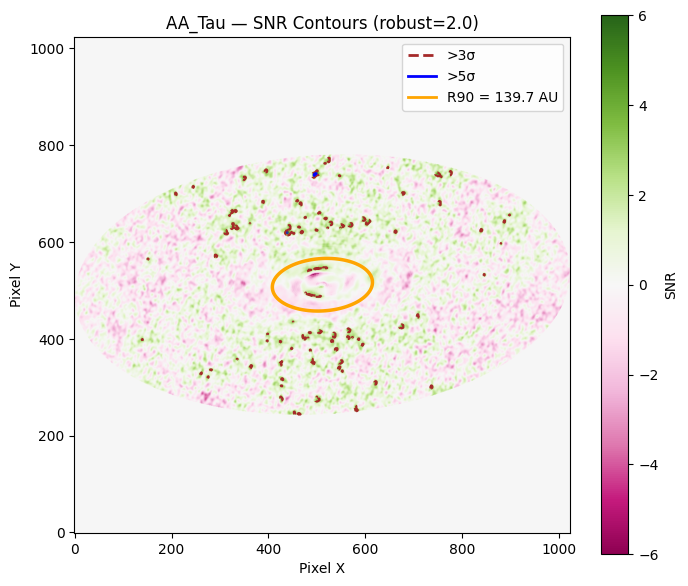

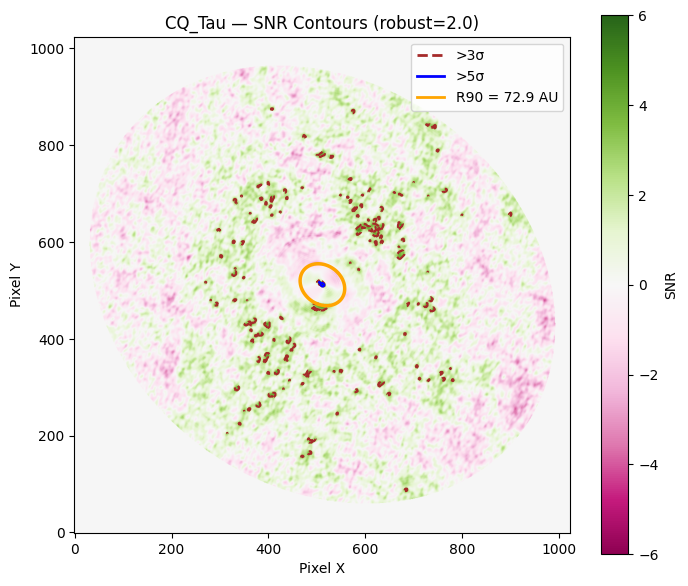

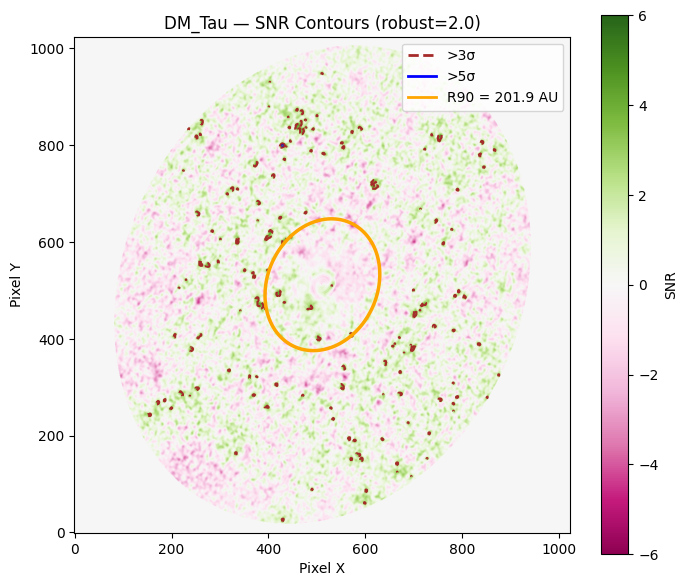

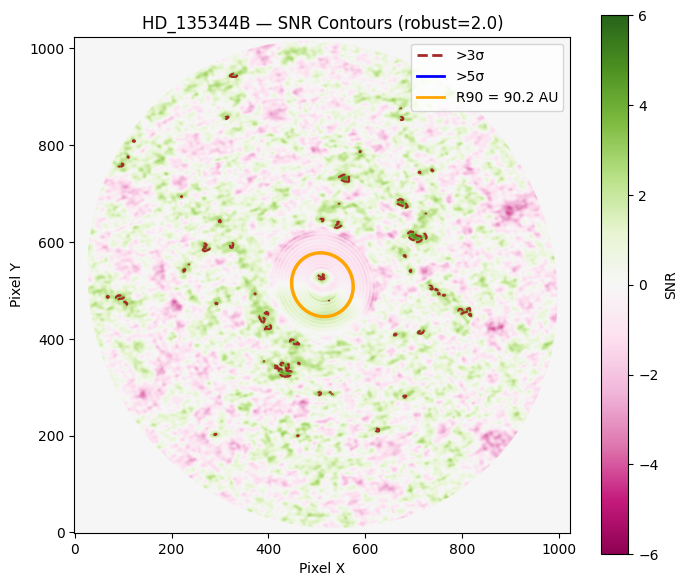

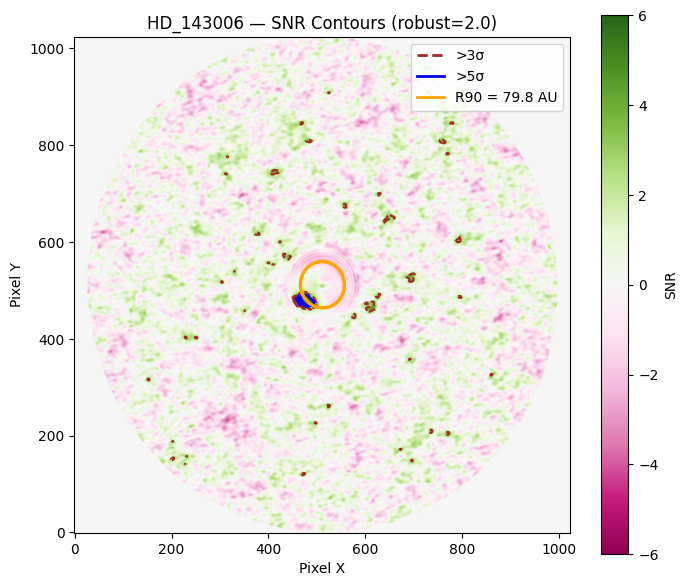

...

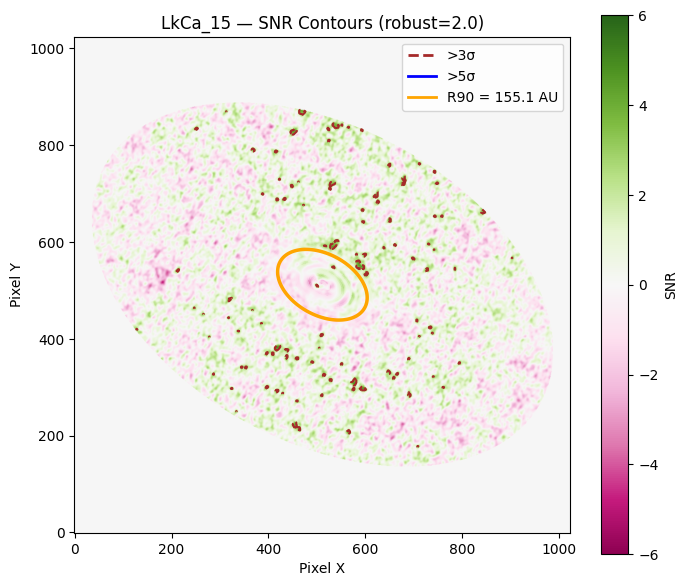

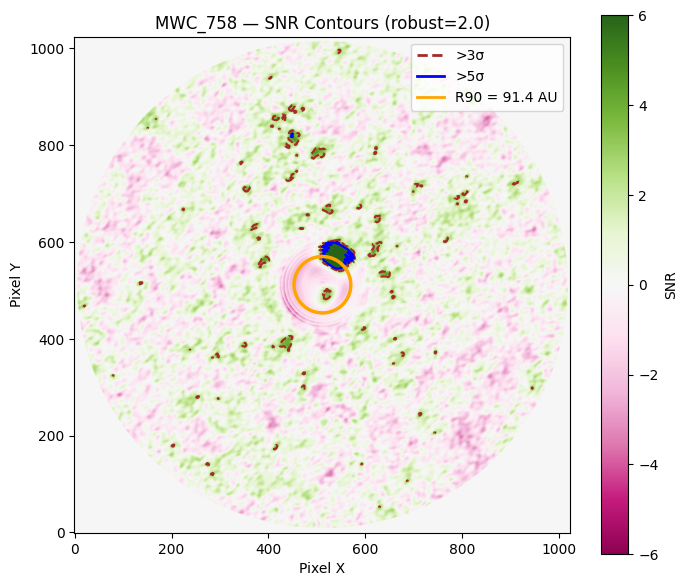

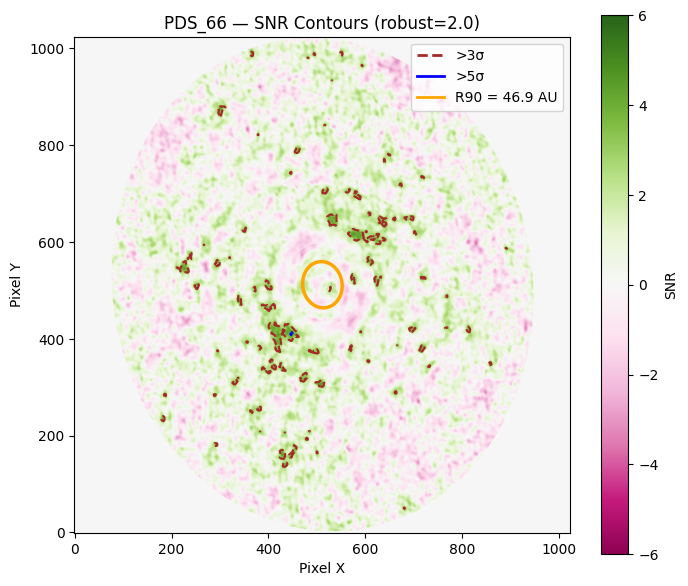

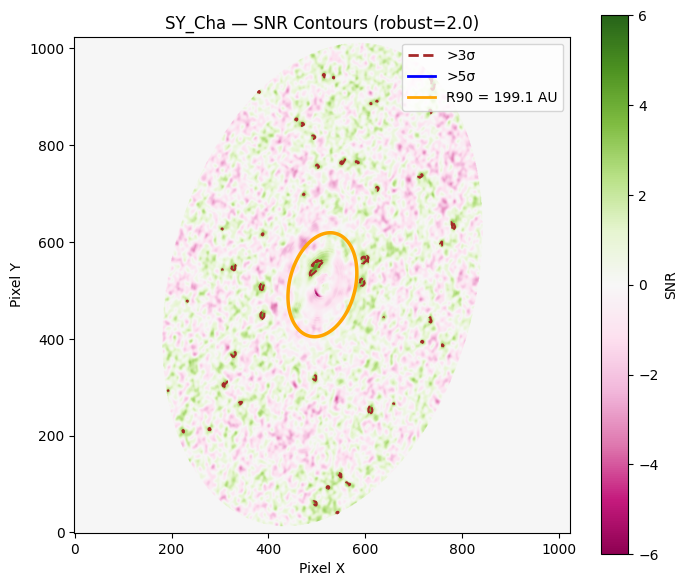

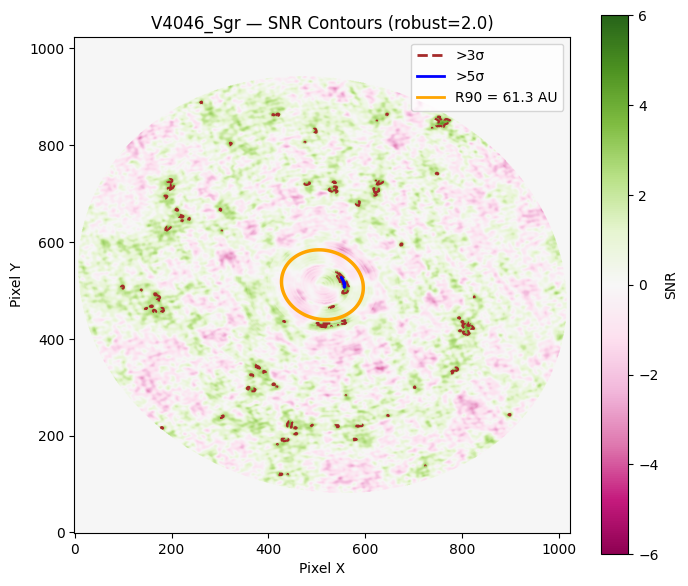

In [19]:
for disk_name, disk_obj in all_disks.items():
    disk_obj.plot_snr_map_simple("2.0", show=True)

In [20]:
# make sure all SNR maps are saved in the object 


In [27]:
robust_vals = [-2.0,-1.5,-1.0,-0.5,0.0,0.5,1.0,1.5,2.0]
for name, disk in all_disks.items():
    for r in robust_vals:
        disk.save_snr_map_as_fits(robust_val=f"{float(r):.1f}", output_dir="SNR_FITS_Maps")

[WARN] AA_Tau: robust -2.0 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] AA_Tau: robust -1.5 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] AA_Tau: robust -1.0 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] AA_Tau: robust -0.5 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] AA_Tau: robust 0.0 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] AA_Tau: robust 0.5 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] AA_Tau: robust 1.0 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] AA_Tau: robust 1.5 not available — skipping SNR.
[WARN] AA_Tau: robust 1.5 SNR map unavailable — skip save.
[WARN] AA_Tau: robust 2.0 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] CQ_Tau: robust -2.0 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] CQ_Tau: robust -1.5 could not build WCS — name 'WCS' is not defined — skip save.
[WARN] CQ

In [22]:
# Use the simplest way to find sources in emission free area
# Essentially , find the countour of all outmost projected radial pixel
# plot it on carta
# And just catalog the ones outside the contour 
# Next NextStep is to extract the peak flux, and also cross compare the 5 sigma sources

# Emission-free Region Source Detection

In [29]:
from astropy.io import fits
from astropy.wcs import WCS
import os
import numpy as np

robust_vals = [-2.0,-1.5,-1.0,-0.5,0.0,0.5,1.0,1.5,2.0]

for disk_name, disk in all_disks.items():
    for r in robust_vals:
        rkey = f"{float(r):.1f}"

        # Build sigma/SNR if missing 
        if rkey not in disk.sigma_masks:
            disk.create_sigma_mask(robust_val=rkey, scale_factor=1.0, save_fits=False)
        if rkey not in disk.snr_maps:
            disk.create_snr_map(robust_val=rkey)

        # Save SNR FITS (skip if prerequisites unavailable)
        disk.save_snr_map_as_fits(robust_val=rkey, output_dir="SNR_FITS_Maps")

[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust-2.0.fits
[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust-1.5.fits
[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust-1.0.fits
[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust-0.5.fits
[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust0.0.fits
[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust0.5.fits
[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust1.0.fits
[WARN] AA_Tau: robust 1.5 not available — skipping sigma.
[WARN] AA_Tau: robust 1.5 not available — skipping SNR.
[WARN] AA_Tau: robust 1.5 not available — skipping SNR.
[SKIP] AA_Tau: robust 1.5 — no SNR map.
[OK]  AA_Tau: saved SNR_FITS_Maps\AA_Tau_SNR_robust2.0.fits
[OK]  CQ_Tau: saved SNR_FITS_Maps\CQ_Tau_SNR_robust-2.0.fits
[OK]  CQ_Tau: saved SNR_FITS_Maps\CQ_Tau_SNR_robust-1.5.fits
[OK]  CQ_Tau: saved SNR_FITS_Maps\CQ_Tau_SNR_robust-1.0.fits
[OK]  CQ_Tau: saved SNR_FITS_Maps\CQ_Tau_SNR_robust-0.5.fits
[OK]  CQ_Tau: saved SNR_FITS_Maps\CQ_Tau_SNR_robust0.0.fits
[O

# Plot Dust Mass Versus Dust Size Profile

*One-sentence summary for Figure 3 in SR12c paper*
The dust mass required to produce a given observed flux, as a function of disk outer radius, under assumed disk parameters (like temperature, opacity, and surface density slope).

**Interpretation of figure 3**
- For disks larger than approximately 1 astronomical unit (au), the dust mass becomes relatively independent of the outer radius, which signifies an optically thin dust emission. 

- Conversely, for disks smaller than about 1 au, the curves become vertical. This indicates that the disks are optically thick, and a smaller disk requires a significantly higher mass to produce the same observed flux. 

In [23]:
# Let 3*sigma be the flux limit for each annulus
# Assume a temperature , surface density, opacity to plot an example profile for one annulus
# project the dy_values back to a 2D image, scale it up by 3 sigma and use it as a mask
# Pinpoint the outliers in position and plot them
#to project a 1D radial standard deviation profile (like σ(r)) back onto a 2D map (to match your residual FITS image)


